In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import yfinance as yf
import math
import matplotlib.pyplot as plt
plt.style.use('default')
%matplotlib inline

In [2]:
df = pd.read_excel('data5min.xlsx', sheet_name = 'TCS')

In [3]:
print(df.high)

0        1347.40
1        1341.63
2        1342.23
3        1341.50
4        1340.83
          ...   
82664    3112.40
82665    3112.40
82666    3112.40
82667    3112.40
82668    3112.40
Name: high, Length: 82669, dtype: float64


In [4]:
def Supertrend(df, atr_period, multiplier):
    
    high = df['high']
    low = df['low']
    close = df['close']
    
    # calculate ATR
    price_diffs = [high - low, 
                   high - close.shift(), 
                   close.shift() - low]
    true_range = pd.concat(price_diffs, axis=1)
    true_range = true_range.abs().max(axis=1)
    # default ATR calculation in supertrend indicator
    atr = true_range.ewm(alpha=1/atr_period,min_periods=atr_period).mean() 
    # df['atr'] = df['tr'].rolling(atr_period).mean()
    
    # HL2 is simply the average of high and low prices
    hl2 = (high + low) / 2
    # upperband and lowerband calculation
    # notice that final bands are set to be equal to the respective bands
    final_upperband = upperband = hl2 + (multiplier * atr)
    final_lowerband = lowerband = hl2 - (multiplier * atr)
    
    # initialize Supertrend column to True
    supertrend = [True] * len(df)
    
    for i in range(1, len(df.index)):
        curr, prev = i, i-1
        
        # if current close price crosses above upperband
        if close[curr] > final_upperband[prev]:
            supertrend[curr] = True
        # if current close price crosses below lowerband
        elif close[curr] < final_lowerband[prev]:
            supertrend[curr] = False
        # else, the trend continues
        else:
            supertrend[curr] = supertrend[prev]
            
            # adjustment to the final bands
            if supertrend[curr] == True and final_lowerband[curr] < final_lowerband[prev]:
                final_lowerband[curr] = final_lowerband[prev]
            if supertrend[curr] == False and final_upperband[curr] > final_upperband[prev]:
                final_upperband[curr] = final_upperband[prev]

        # to remove bands according to the trend direction
        if supertrend[curr] == True:
            final_upperband[curr] = np.nan
        else:
            final_lowerband[curr] = np.nan
    
    return pd.DataFrame({
        'Supertrend': supertrend,
        'Final Lowerband': final_lowerband,
        'Final Upperband': final_upperband
    }, index=df.index)

In [5]:
def see(symb, df, df3):
    print(f'\n')
    print(f'\t\t\t\t\t{symb}')
    plt.figure(figsize=(32, 16))
    plt.plot( df['close'])
    plt.plot(df['Final Lowerband'], 'g')
    plt.plot(df3['Final Lowerband'], 'g')
    plt.plot(df['Final Upperband'], 'r')
    plt.plot(df3['Final Upperband'], 'r')
    plt.show()

In [23]:
def backtest_supertrend(df, df3, symb, rsi):
    is_uptrend1 = df['Supertrend']
    is_uptrend2 = df3['Supertrend']
    in_position = 0
    process=0
    bp=0
    sp=0
    position = []
    entry = []
    exit = []
    time1 = []
    time2 = []
    for i in range(len(df)-1):
        if(process==0):
            if(in_position==0):
                if (is_uptrend1[i] and is_uptrend2[i] and rsi[i+1]<=40):
                    process=1
                    bp=df.close[i]

            elif(in_position==1):
                if not is_uptrend1[i] and not is_uptrend2[i] and rsi[i+1]>=70:
                    process=1
                    sp=df.close[i]
        
        else:
            if(bp>0):
                if(bp>df.low[i] and bp<df.high[i]):
                    in_position=1
                    position.append(1)
                    time1.append(str(df.date[i]))
                    entry.append(bp)
                    print(df.date[i])
                    bp=0
                    process=0
            if(sp>0):
                if(sp>df.low[i] and sp<df.high[i]):
                    in_position=0
                    time2.append(str(df.date[i]))
                    exit.append(sp)
                    sp=0
                    process=0
            

    if(in_position!=0):
        time2.append(str(df.date[i]))
        exit.append(df.close[i])
    
    print(time1)
    return (position, time1, time2, entry, exit)
            

In [7]:
symbol = ['NIFTY%20BANK','NIFTY%2050', 'ADANIPORTS', 'APOLLOHOSP', 'ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BAJAJFINSV', 'BAJFINANCE', 'BPCL',
          'BHARTIARTL', 'BRITANNIA', 'CIPLA', 'COALINDIA', 'DRREDDY', 'DIVISLAB', 'GRASIM'
        , 'HCLTECH', 'HDFC', 'HDFCBANK', 'HDFCLIFE', 'HEROMOTOCO', 'HINDALCO', 'HINDUNILVR', 'ICICIBANK',
          'ITC', 'INDUSINDBK', 'INFY', 'JSWSTEEL', 'KOTAKBANK', 'LT', 'M&M', 'MARUTI', 'NTPC', 'NESTLEIND', 'ONGC', 
        'POWERGRID', 'RELIANCE', 'SBILIFE', 'SBIN', 'SHREECEM', 'SUNPHARMA', 'TATAMOTORS', 'TATACONSUM', 'TATASTEEL', 
        'TCS', 'TECHM', 'TITAN', 'UPL', 'WIPRO', 'ULTRACEMCO']

T = []
k=0
for i in symbol:
    T.append(pd.read_excel('data5min.xlsx', sheet_name = i))
    print(i)

NIFTY%20BANK
NIFTY%2050
ADANIPORTS
APOLLOHOSP
ASIANPAINT
AXISBANK
BAJAJ-AUTO
BAJAJFINSV
BAJFINANCE
BPCL
BHARTIARTL
BRITANNIA
CIPLA
COALINDIA
DRREDDY
DIVISLAB
GRASIM
HCLTECH
HDFC
HDFCBANK
HDFCLIFE
HEROMOTOCO
HINDALCO
HINDUNILVR
ICICIBANK
ITC
INDUSINDBK
INFY
JSWSTEEL
KOTAKBANK
LT
M&M
MARUTI
NTPC
NESTLEIND
ONGC
POWERGRID
RELIANCE
SBILIFE
SBIN
SHREECEM
SUNPHARMA
TATAMOTORS
TATACONSUM
TATASTEEL
TCS
TECHM
TITAN
UPL
WIPRO
ULTRACEMCO


In [14]:
def RSI(data, window=14, adjust=False):
    delta = data['close'].diff(1).dropna()
    loss = delta.copy()
    gains = delta.copy()

    gains[gains < 0] = 0
    loss[loss > 0] = 0

    gain_ewm = gains.ewm(com=window - 1, adjust=adjust).mean()
    loss_ewm = abs(loss.ewm(com=window - 1, adjust=adjust).mean())

    RS = gain_ewm / loss_ewm
    RSI = 100 - 100 / (1 + RS)

    return RSI

NIFTY%20BANK


					NIFTY%20BANK


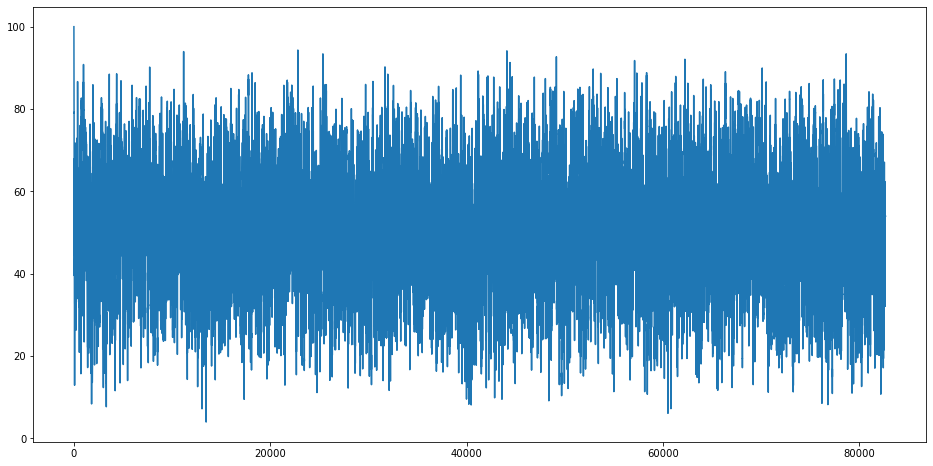

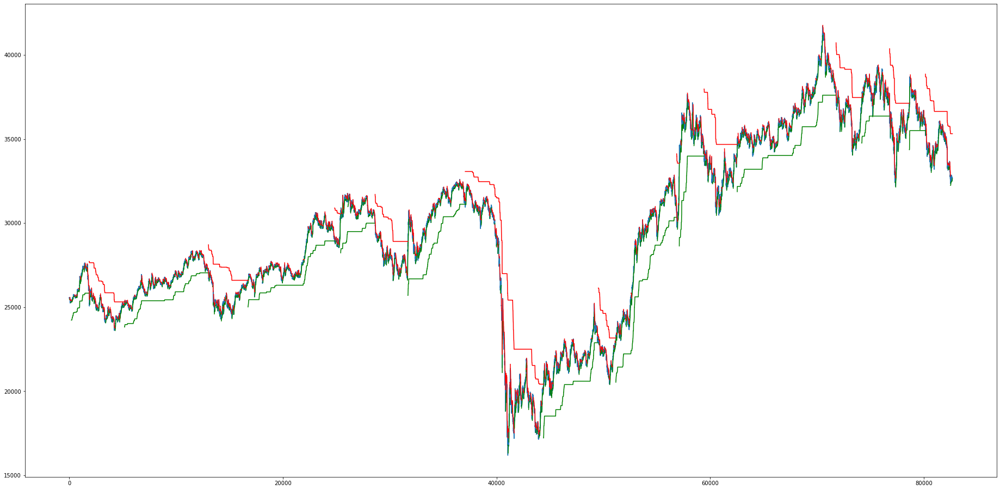

2018-01-01 13:20:00
2018-04-13 12:55:00
2018-11-30 11:35:00
2019-05-21 12:35:00
2019-09-24 09:30:00
2020-06-08 12:25:00
2020-10-08 14:00:00
2021-05-26 15:00:00
2022-01-06 14:25:00
2022-04-05 09:35:00
['2018-01-01 13:20:00', '2018-04-13 12:55:00', '2018-11-30 11:35:00', '2019-05-21 12:35:00', '2019-09-24 09:30:00', '2020-06-08 12:25:00', '2020-10-08 14:00:00', '2021-05-26 15:00:00', '2022-01-06 14:25:00', '2022-04-05 09:35:00']
NIFTY%2050


					NIFTY%2050


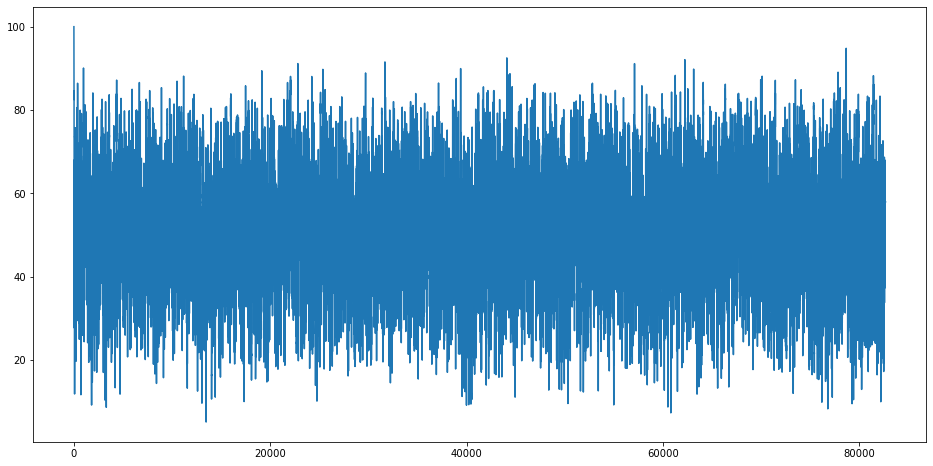

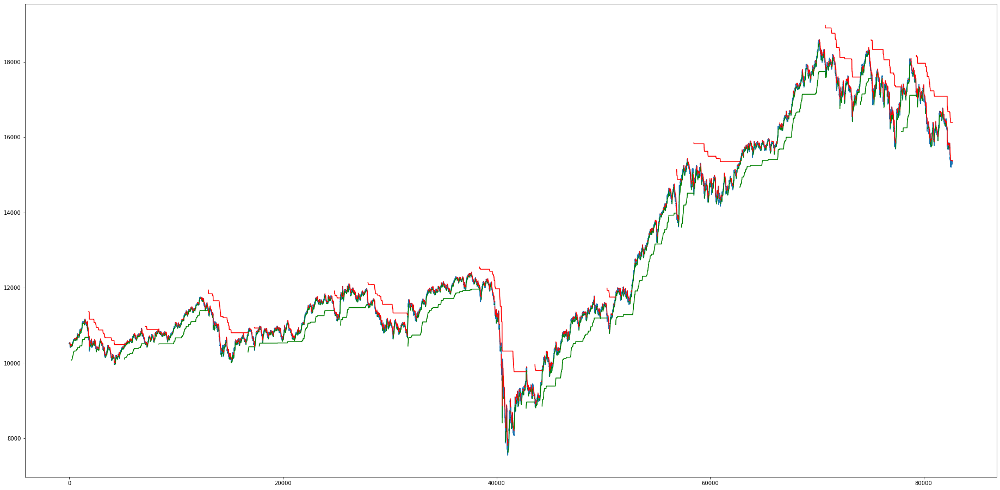

2018-01-01 13:10:00
2018-04-16 13:40:00
2018-06-13 14:45:00
2018-11-30 11:40:00
2018-12-27 13:00:00
2019-05-21 12:35:00
2019-09-24 10:35:00
2020-04-30 13:00:00
2020-06-01 13:35:00
['2018-01-01 13:10:00', '2018-04-16 13:40:00', '2018-06-13 14:45:00', '2018-11-30 11:40:00', '2018-12-27 13:00:00', '2019-05-21 12:35:00', '2019-09-24 10:35:00', '2020-04-30 13:00:00', '2020-06-01 13:35:00']
ADANIPORTS


					ADANIPORTS


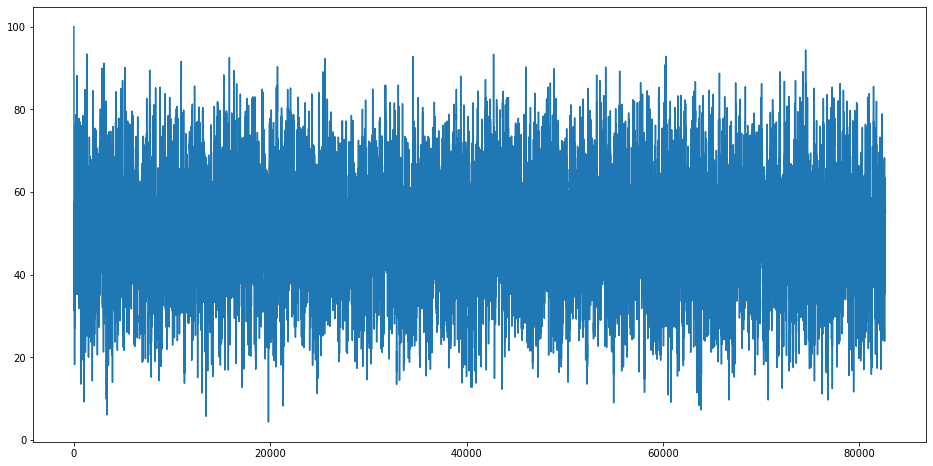

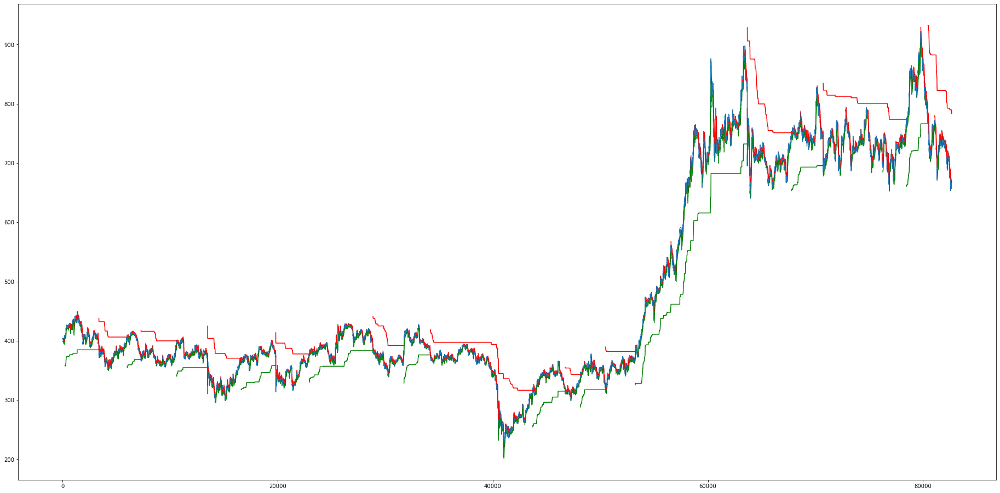

2018-01-01 13:25:00
2018-04-30 10:55:00
2018-07-25 15:15:00
2018-11-27 12:35:00
2019-04-01 14:50:00
2019-09-25 13:25:00
2020-05-20 10:05:00
2020-08-12 12:10:00
2020-11-18 13:55:00
2021-09-01 12:55:00
2022-03-30 13:40:00
['2018-01-01 13:25:00', '2018-04-30 10:55:00', '2018-07-25 15:15:00', '2018-11-27 12:35:00', '2019-04-01 14:50:00', '2019-09-25 13:25:00', '2020-05-20 10:05:00', '2020-08-12 12:10:00', '2020-11-18 13:55:00', '2021-09-01 12:55:00', '2022-03-30 13:40:00']
APOLLOHOSP


					APOLLOHOSP


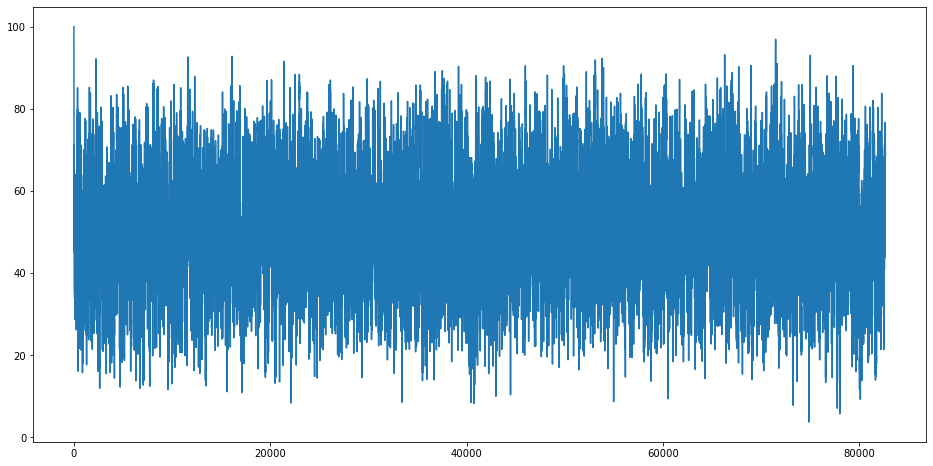

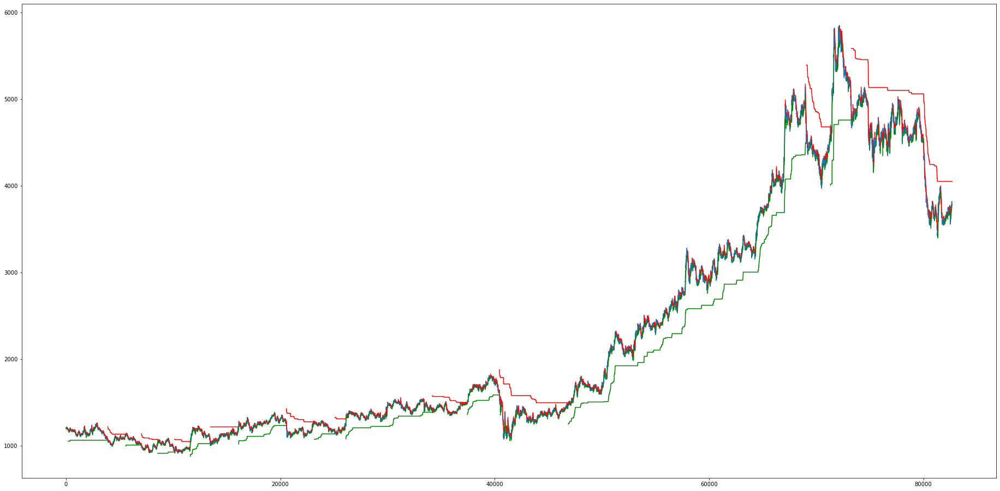

2018-01-01 15:05:00
2018-04-23 10:50:00
2018-06-18 11:30:00
2018-08-17 14:25:00
2018-11-21 13:55:00
2019-04-05 10:55:00
2019-06-04 09:30:00
2020-01-15 13:45:00
2020-07-20 11:55:00
2021-11-15 15:10:00
['2018-01-01 15:05:00', '2018-04-23 10:50:00', '2018-06-18 11:30:00', '2018-08-17 14:25:00', '2018-11-21 13:55:00', '2019-04-05 10:55:00', '2019-06-04 09:30:00', '2020-01-15 13:45:00', '2020-07-20 11:55:00', '2021-11-15 15:10:00']
ASIANPAINT


					ASIANPAINT


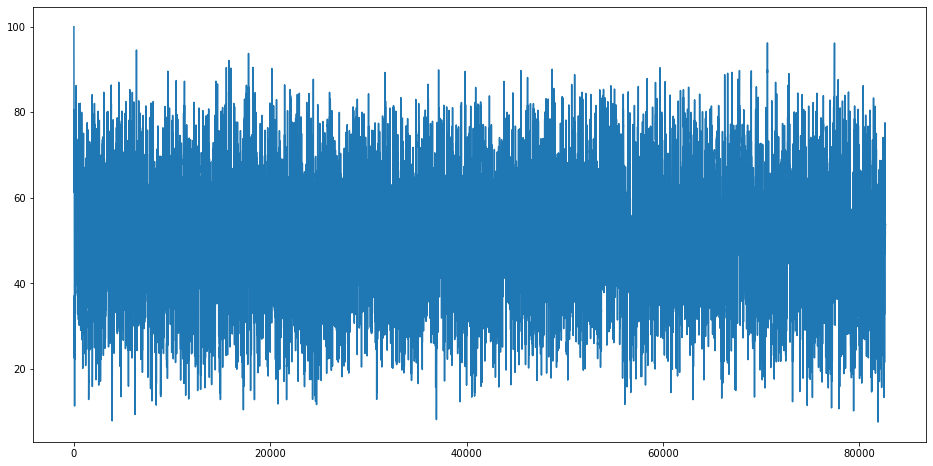

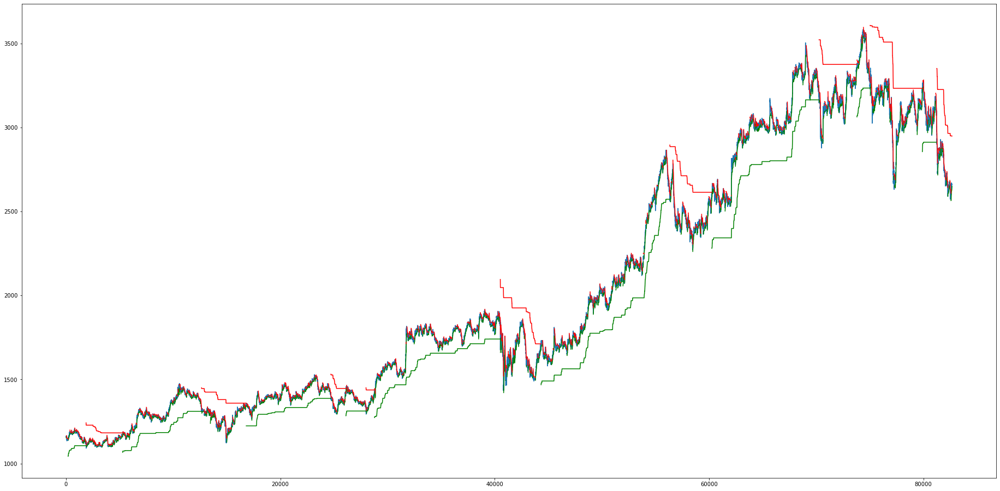

2018-01-04 09:35:00
2018-04-16 15:15:00
2018-11-30 11:25:00
2019-06-04 09:20:00
2020-06-02 14:50:00
2021-04-07 13:00:00
2021-12-29 10:30:00
2022-04-28 15:20:00
['2018-01-04 09:35:00', '2018-04-16 15:15:00', '2018-11-30 11:25:00', '2019-06-04 09:20:00', '2020-06-02 14:50:00', '2021-04-07 13:00:00', '2021-12-29 10:30:00', '2022-04-28 15:20:00']
AXISBANK


					AXISBANK


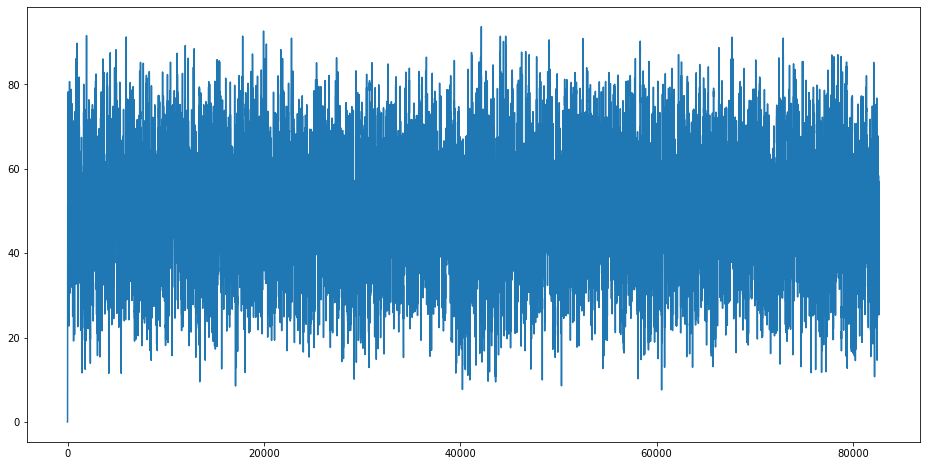

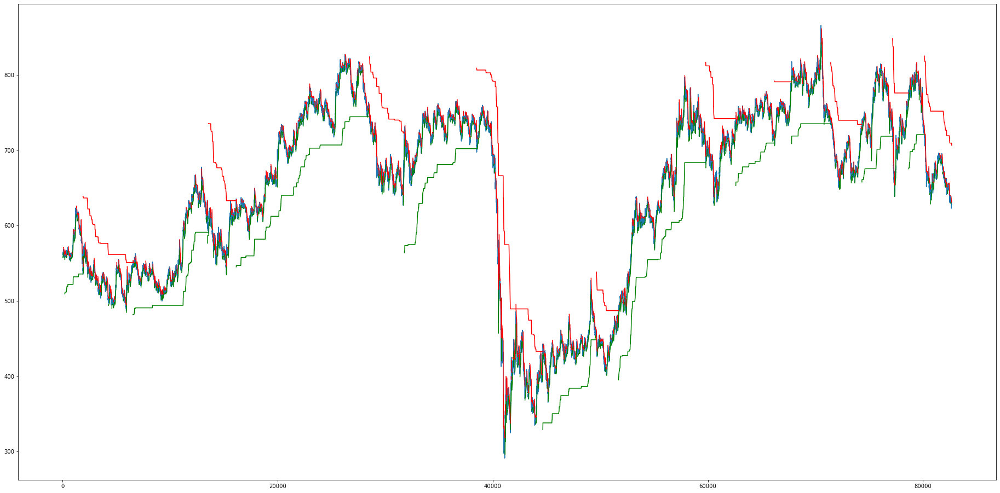

2018-01-01 09:20:00
2018-05-10 10:45:00
2018-11-16 13:20:00
2019-09-24 11:10:00
2020-06-09 12:50:00
2020-10-20 09:30:00
2021-05-26 14:55:00
2021-09-01 14:25:00
2022-01-07 11:45:00
['2018-01-01 09:20:00', '2018-05-10 10:45:00', '2018-11-16 13:20:00', '2019-09-24 11:10:00', '2020-06-09 12:50:00', '2020-10-20 09:30:00', '2021-05-26 14:55:00', '2021-09-01 14:25:00', '2022-01-07 11:45:00']
BAJAJ-AUTO


					BAJAJ-AUTO


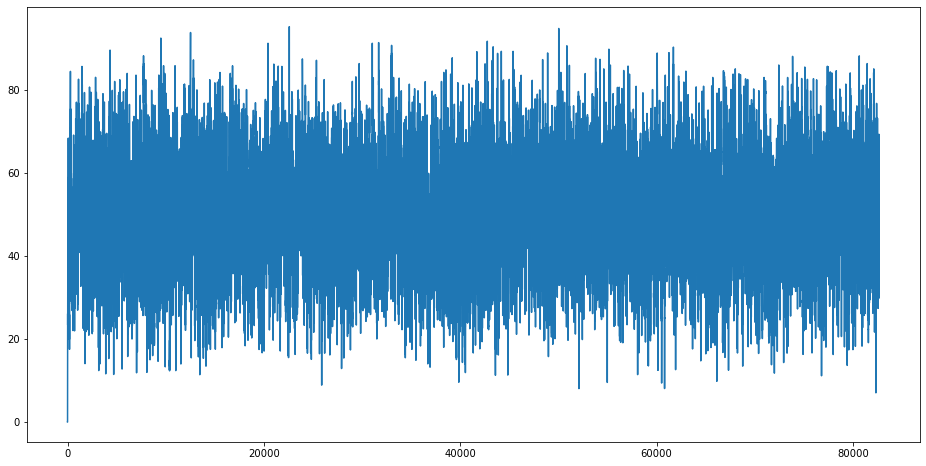

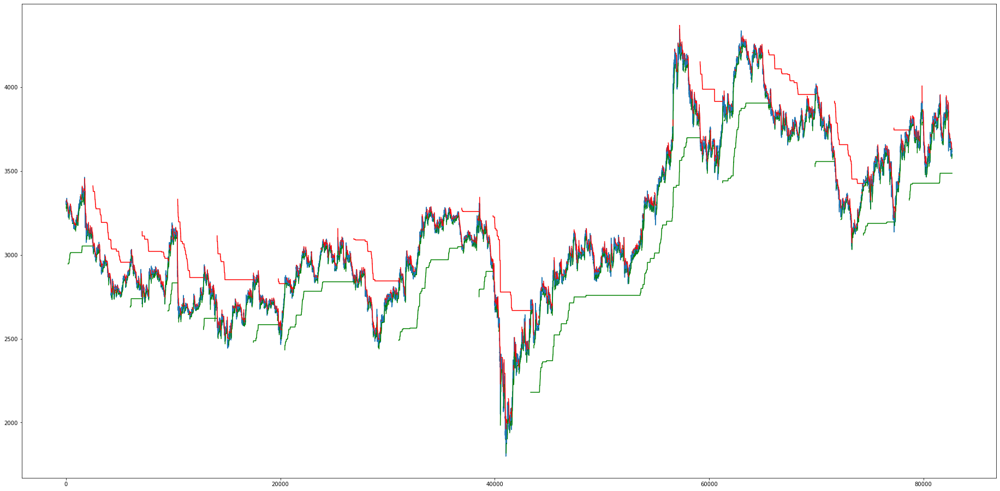

2018-01-01 09:20:00
2018-04-27 15:15:00
2018-07-06 09:15:00
2018-09-10 12:10:00
2018-12-17 14:35:00
2019-02-07 13:30:00
2019-09-11 09:15:00
2020-02-04 10:25:00
2020-05-13 14:20:00
2021-04-28 13:00:00
2021-10-12 12:20:00
2022-01-10 14:10:00
2022-04-06 15:05:00
['2018-01-01 09:20:00', '2018-04-27 15:15:00', '2018-07-06 09:15:00', '2018-09-10 12:10:00', '2018-12-17 14:35:00', '2019-02-07 13:30:00', '2019-09-11 09:15:00', '2020-02-04 10:25:00', '2020-05-13 14:20:00', '2021-04-28 13:00:00', '2021-10-12 12:20:00', '2022-01-10 14:10:00', '2022-04-06 15:05:00']
BAJAJFINSV


					BAJAJFINSV


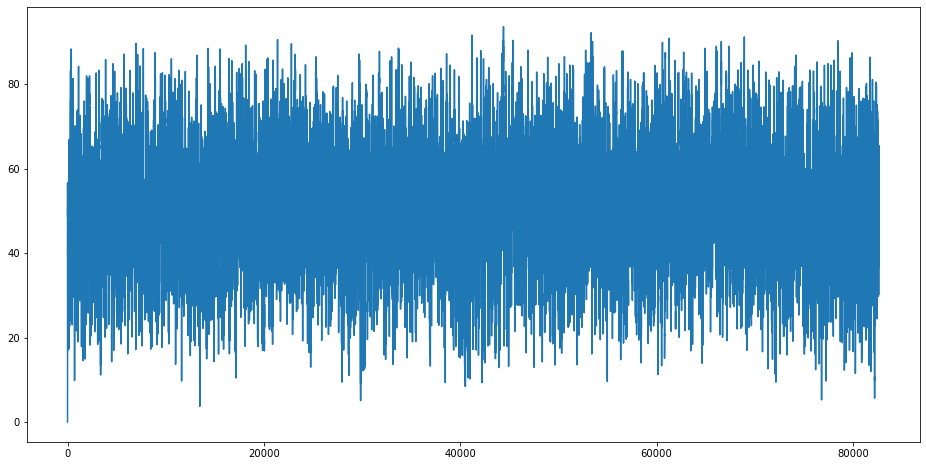

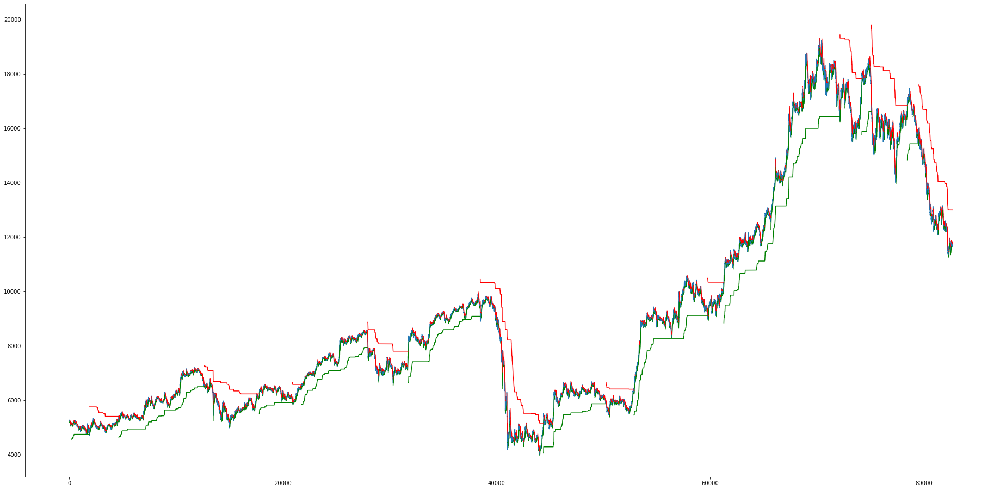

2018-01-01 09:20:00
2018-04-04 11:25:00
2018-12-20 09:20:00
2019-03-06 12:50:00
2019-09-24 11:40:00
2020-06-03 12:50:00
2020-11-09 13:20:00
2021-04-30 12:15:00
2022-01-06 14:20:00
2022-03-30 15:25:00
['2018-01-01 09:20:00', '2018-04-04 11:25:00', '2018-12-20 09:20:00', '2019-03-06 12:50:00', '2019-09-24 11:40:00', '2020-06-03 12:50:00', '2020-11-09 13:20:00', '2021-04-30 12:15:00', '2022-01-06 14:20:00', '2022-03-30 15:25:00']
BAJFINANCE


					BAJFINANCE


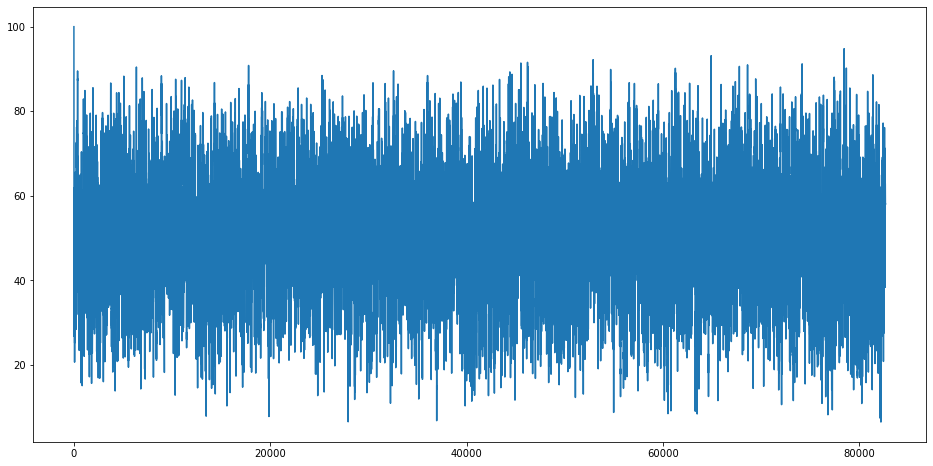

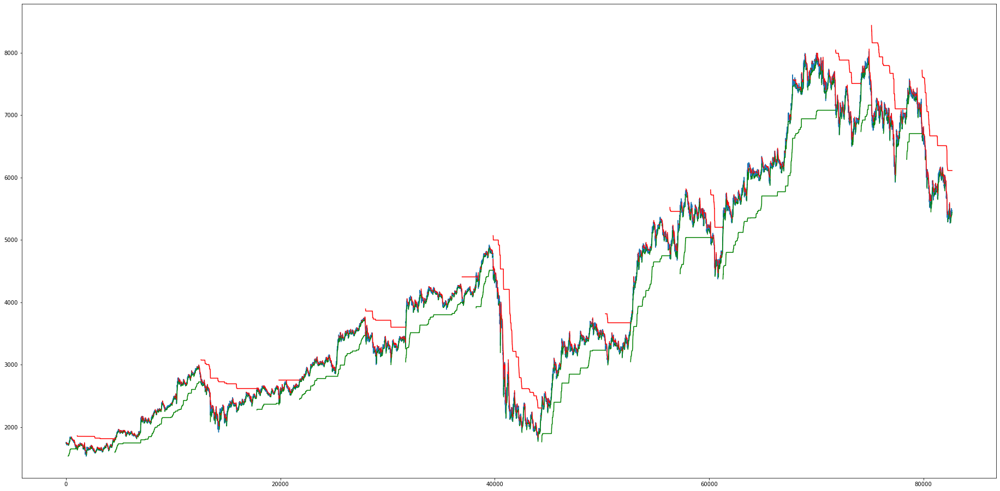

2018-01-01 11:00:00
2018-04-03 11:00:00
2018-12-19 15:20:00
2019-03-06 13:00:00
2019-09-24 09:45:00
2020-01-31 09:20:00
2020-06-03 14:40:00
2020-11-06 14:35:00
2021-04-30 09:35:00
2022-01-06 12:45:00
2022-03-31 12:20:00
['2018-01-01 11:00:00', '2018-04-03 11:00:00', '2018-12-19 15:20:00', '2019-03-06 13:00:00', '2019-09-24 09:45:00', '2020-01-31 09:20:00', '2020-06-03 14:40:00', '2020-11-06 14:35:00', '2021-04-30 09:35:00', '2022-01-06 12:45:00', '2022-03-31 12:20:00']
BPCL


					BPCL


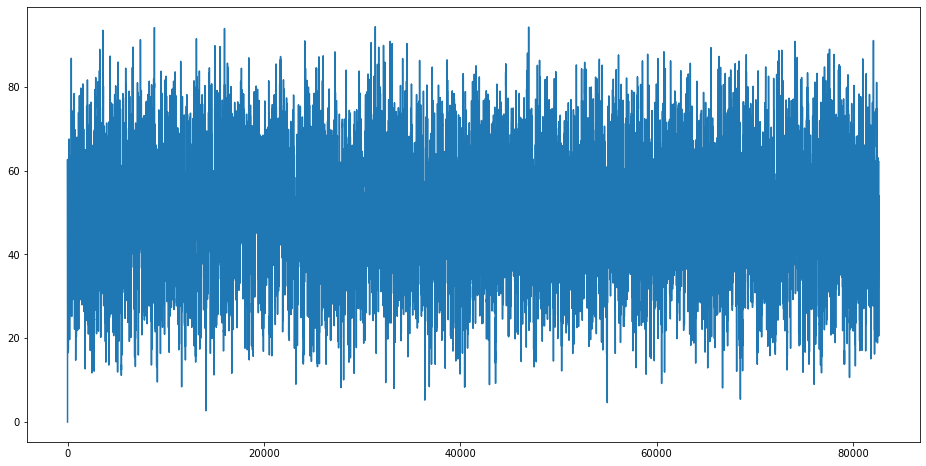

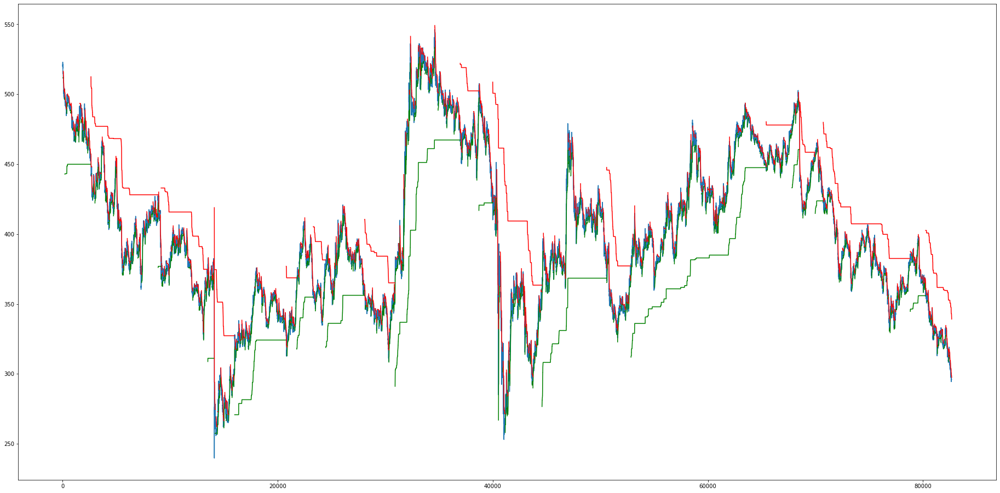

2018-01-01 09:20:00
2018-06-22 14:50:00
2018-09-24 12:05:00
2018-11-14 12:50:00
2019-09-06 13:05:00
2020-02-06 11:40:00
2020-06-09 09:25:00
2020-11-10 13:20:00
2021-09-01 14:30:00
2021-10-13 14:50:00
2022-04-08 11:15:00
['2018-01-01 09:20:00', '2018-06-22 14:50:00', '2018-09-24 12:05:00', '2018-11-14 12:50:00', '2019-09-06 13:05:00', '2020-02-06 11:40:00', '2020-06-09 09:25:00', '2020-11-10 13:20:00', '2021-09-01 14:30:00', '2021-10-13 14:50:00', '2022-04-08 11:15:00']
BHARTIARTL


					BHARTIARTL


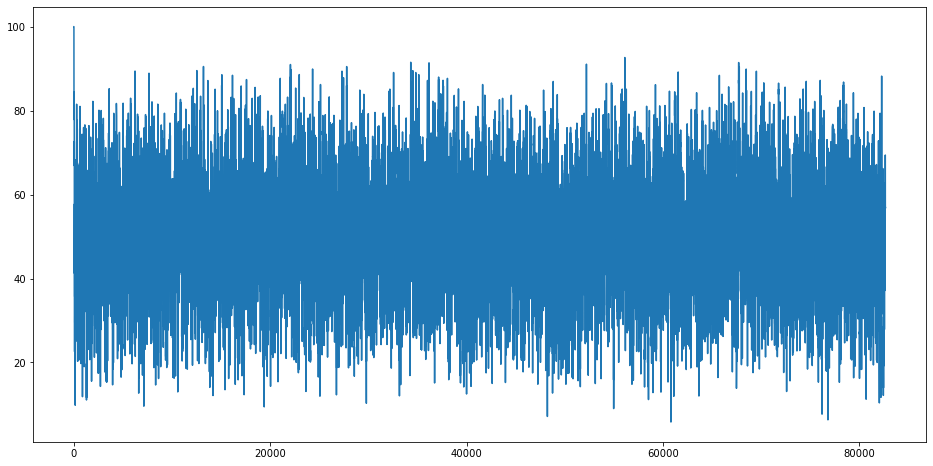

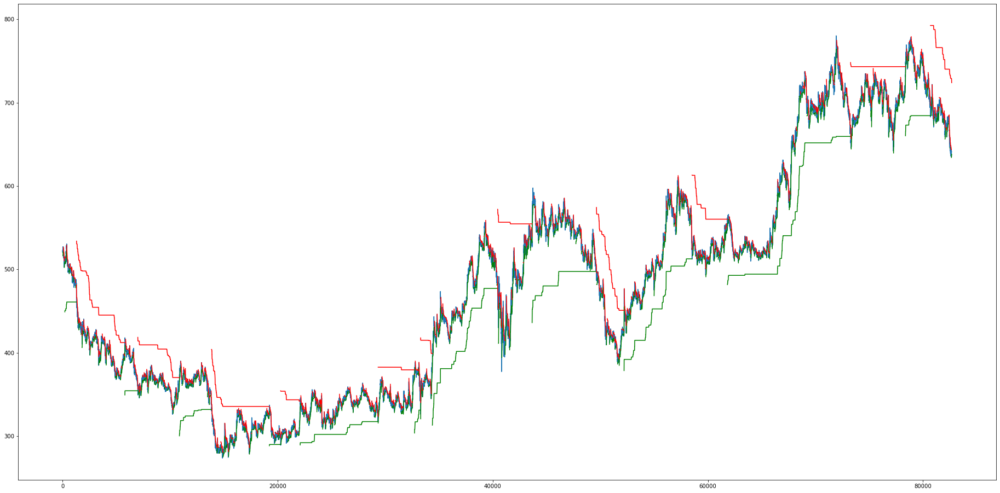

2018-01-01 14:45:00
2018-04-25 13:05:00
2018-08-01 11:20:00
2019-01-16 13:15:00
2019-03-13 09:50:00
['2018-01-01 14:45:00', '2018-04-25 13:05:00', '2018-08-01 11:20:00', '2019-01-16 13:15:00', '2019-03-13 09:50:00']
BRITANNIA


					BRITANNIA


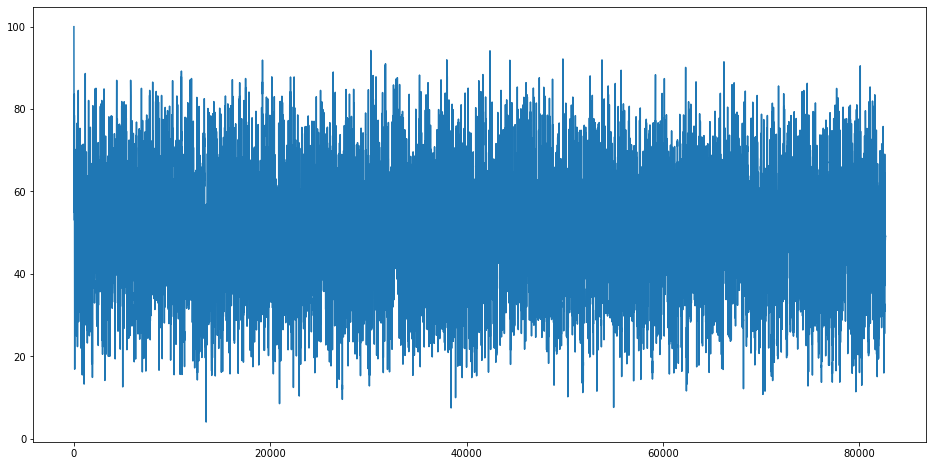

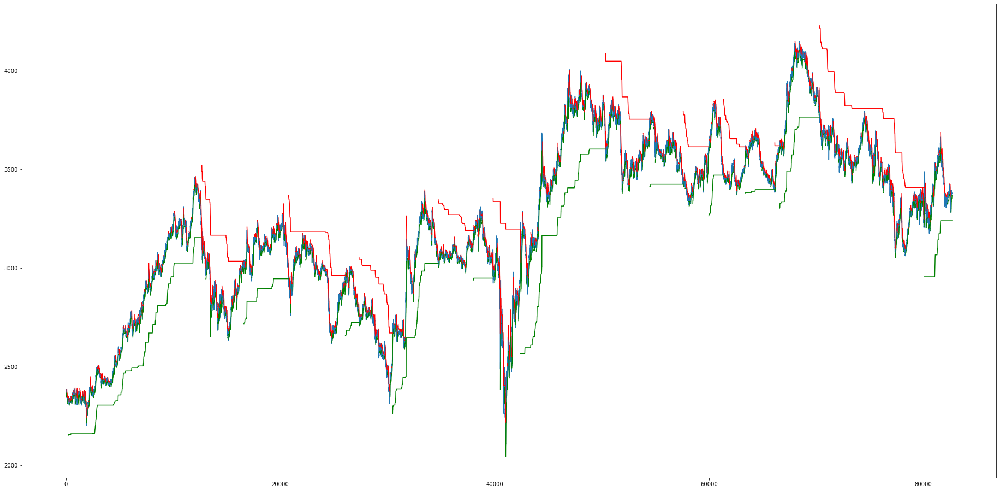

2018-01-01 15:00:00
2018-11-27 11:20:00
2019-05-31 13:20:00
2019-08-27 13:55:00
2020-01-28 13:30:00
2020-04-29 12:05:00
2020-12-11 10:20:00
2021-03-31 10:15:00
2021-06-08 14:05:00
2021-08-09 15:00:00
2022-05-04 14:35:00
['2018-01-01 15:00:00', '2018-11-27 11:20:00', '2019-05-31 13:20:00', '2019-08-27 13:55:00', '2020-01-28 13:30:00', '2020-04-29 12:05:00', '2020-12-11 10:20:00', '2021-03-31 10:15:00', '2021-06-08 14:05:00', '2021-08-09 15:00:00', '2022-05-04 14:35:00']
CIPLA


					CIPLA


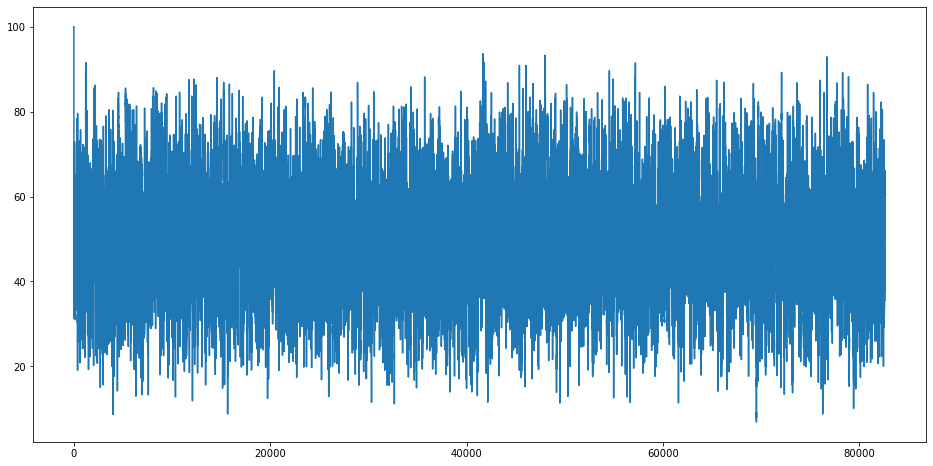

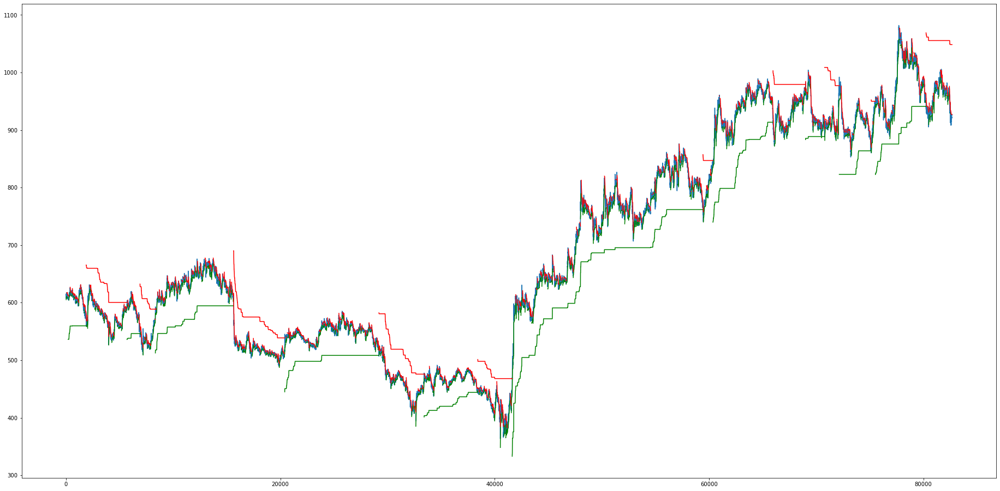

2018-01-01 09:35:00
2018-04-26 15:10:00
2018-06-13 13:10:00
2019-02-07 15:20:00
2019-10-30 09:15:00
2020-04-07 14:35:00
2021-04-08 12:00:00
2021-09-28 12:20:00
2021-11-29 12:55:00
['2018-01-01 09:35:00', '2018-04-26 15:10:00', '2018-06-13 13:10:00', '2019-02-07 15:20:00', '2019-10-30 09:15:00', '2020-04-07 14:35:00', '2021-04-08 12:00:00', '2021-09-28 12:20:00', '2021-11-29 12:55:00']
COALINDIA


					COALINDIA


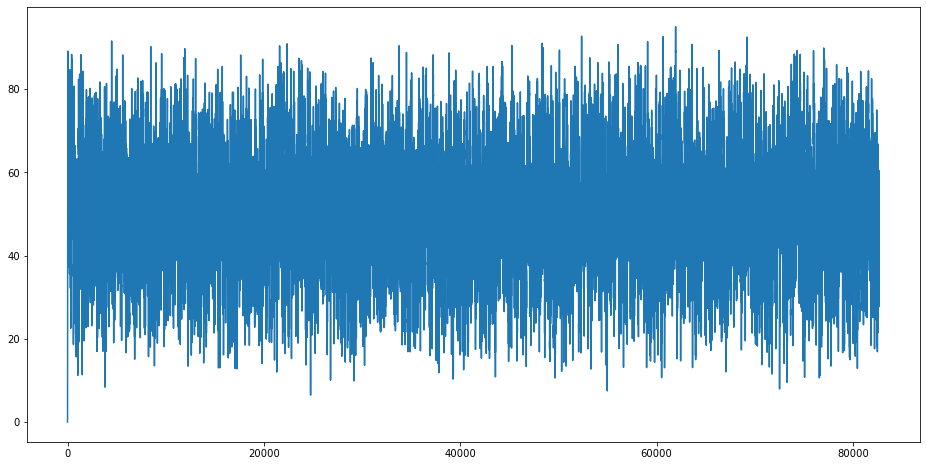

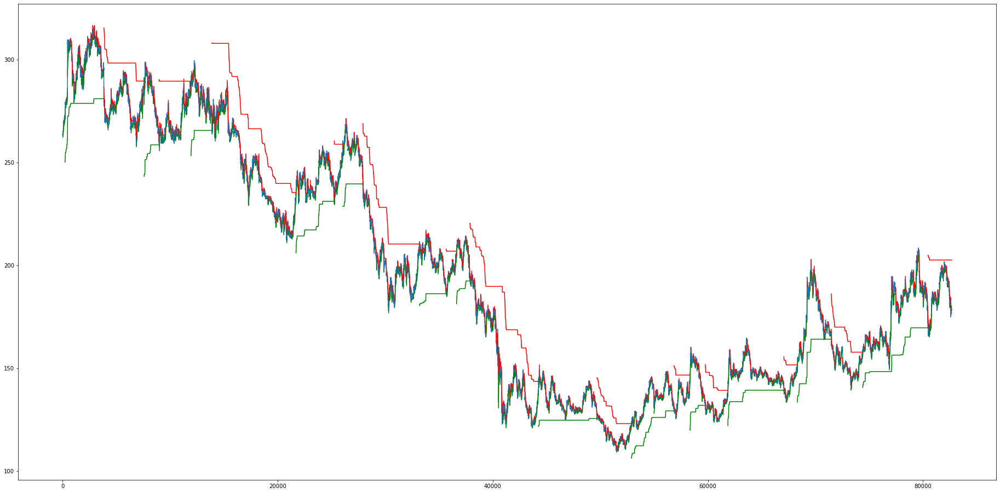

2018-01-01 09:20:00
2018-05-30 15:10:00
2018-08-23 09:15:00
2019-03-06 09:30:00
2019-05-31 11:50:00
2019-10-23 13:35:00
2020-01-01 11:15:00
2020-06-02 09:15:00
2020-11-10 14:20:00
2021-05-12 10:20:00
['2018-01-01 09:20:00', '2018-05-30 15:10:00', '2018-08-23 09:15:00', '2019-03-06 09:30:00', '2019-05-31 11:50:00', '2019-10-23 13:35:00', '2020-01-01 11:15:00', '2020-06-02 09:15:00', '2020-11-10 14:20:00', '2021-05-12 10:20:00']
DRREDDY


					DRREDDY


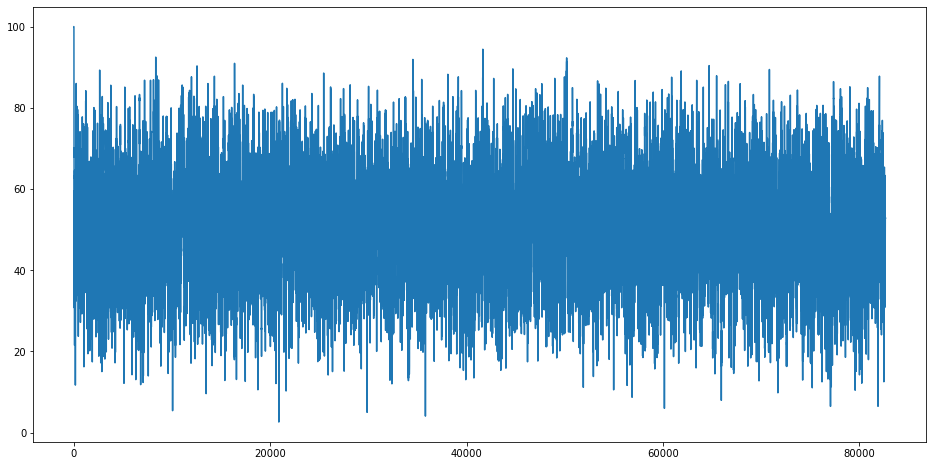

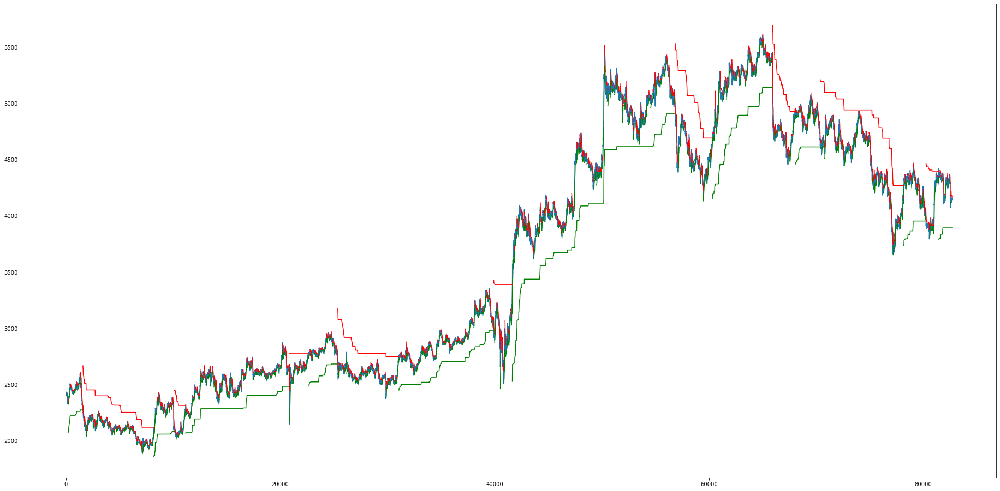

2018-01-01 13:10:00
2018-06-11 12:15:00
2019-03-25 14:30:00
2019-09-09 11:45:00
2020-04-09 11:05:00
2021-04-07 13:45:00
2021-09-06 14:50:00
2022-03-25 12:10:00
2022-05-30 14:40:00
['2018-01-01 13:10:00', '2018-06-11 12:15:00', '2019-03-25 14:30:00', '2019-09-09 11:45:00', '2020-04-09 11:05:00', '2021-04-07 13:45:00', '2021-09-06 14:50:00', '2022-03-25 12:10:00', '2022-05-30 14:40:00']
DIVISLAB


					DIVISLAB


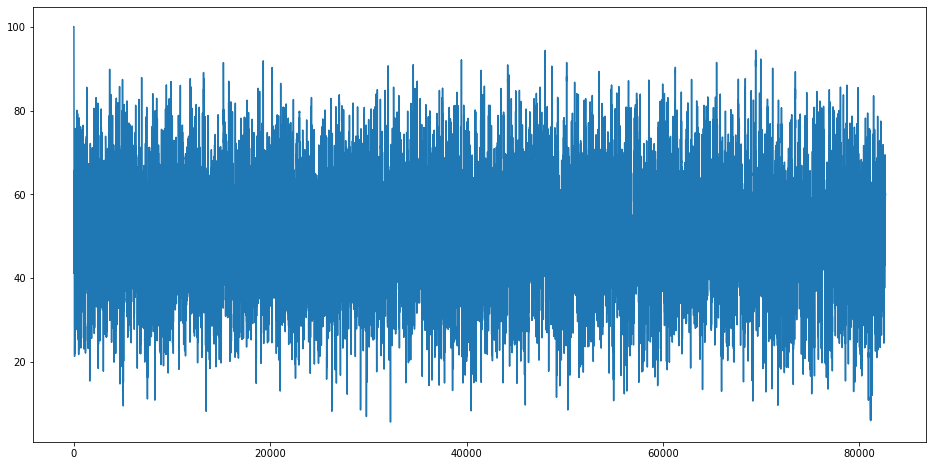

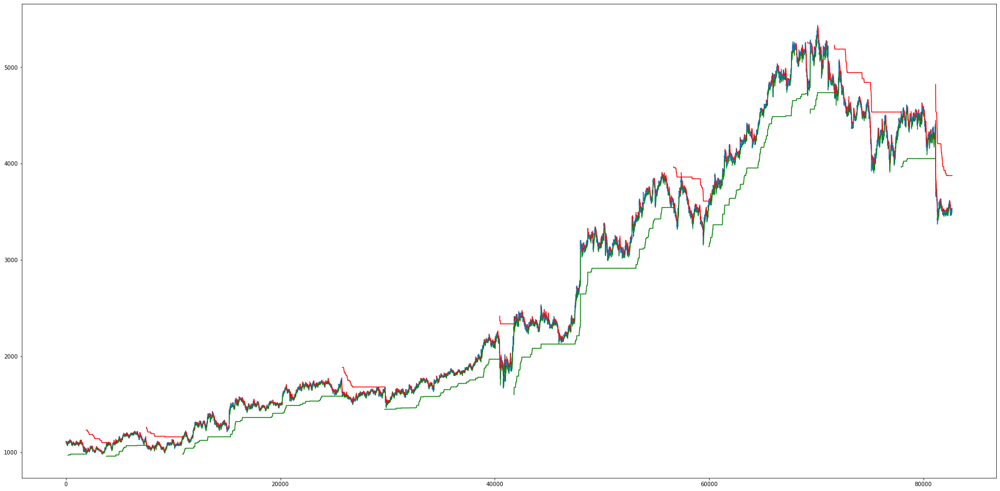

2018-01-01 15:05:00
2018-03-15 14:05:00
2018-07-31 13:50:00
2019-08-09 15:05:00
2021-03-31 14:40:00
2021-10-05 09:35:00
2022-03-23 09:30:00
['2018-01-01 15:05:00', '2018-03-15 14:05:00', '2018-07-31 13:50:00', '2019-08-09 15:05:00', '2021-03-31 14:40:00', '2021-10-05 09:35:00', '2022-03-23 09:30:00']
GRASIM


					GRASIM


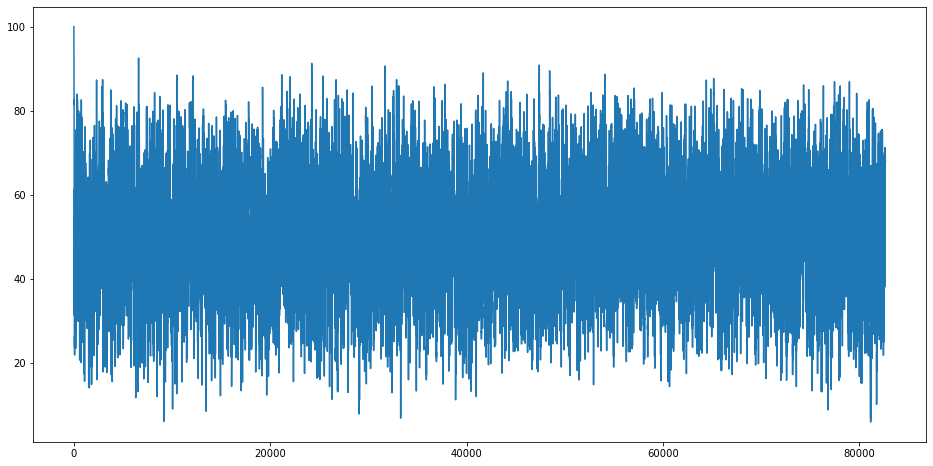

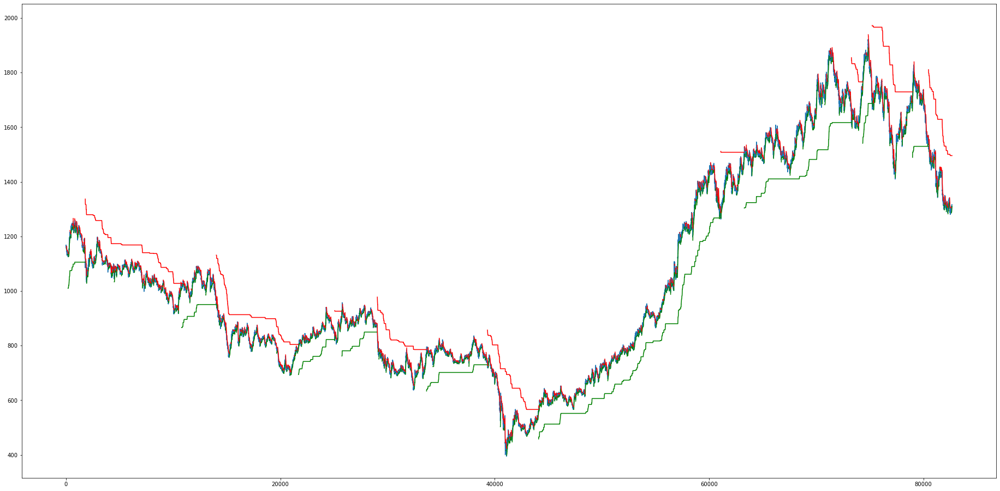

2018-01-01 13:35:00
2018-07-30 10:25:00
2019-03-06 13:00:00
2019-06-06 14:25:00
2019-11-01 13:05:00
2020-06-02 09:55:00
2021-06-07 11:55:00
['2018-01-01 13:35:00', '2018-07-30 10:25:00', '2019-03-06 13:00:00', '2019-06-06 14:25:00', '2019-11-01 13:05:00', '2020-06-02 09:55:00', '2021-06-07 11:55:00']
HCLTECH


					HCLTECH


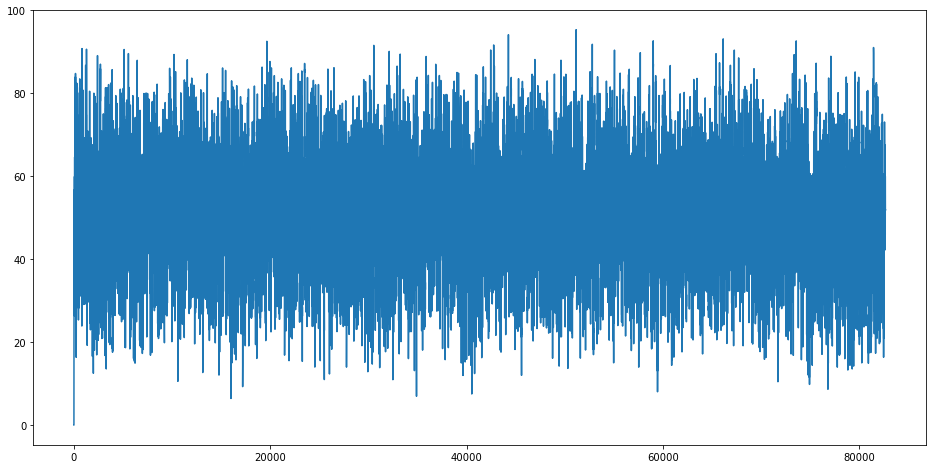

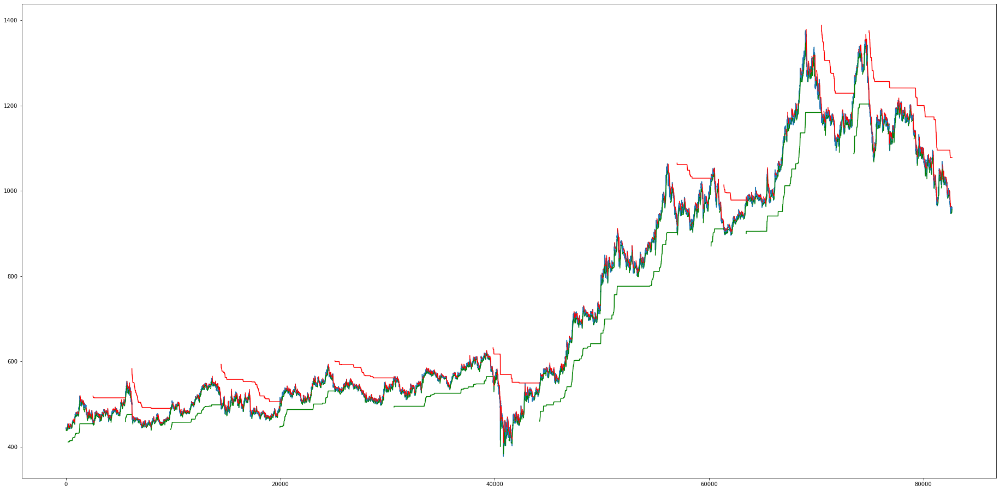

2018-01-01 09:20:00
2018-04-20 15:20:00
2018-07-10 14:25:00
2019-01-31 09:45:00
2019-09-03 12:45:00
2020-06-01 12:25:00
2021-04-06 14:25:00
2021-06-09 13:10:00
2021-12-23 12:10:00
['2018-01-01 09:20:00', '2018-04-20 15:20:00', '2018-07-10 14:25:00', '2019-01-31 09:45:00', '2019-09-03 12:45:00', '2020-06-01 12:25:00', '2021-04-06 14:25:00', '2021-06-09 13:10:00', '2021-12-23 12:10:00']
HDFC


					HDFC


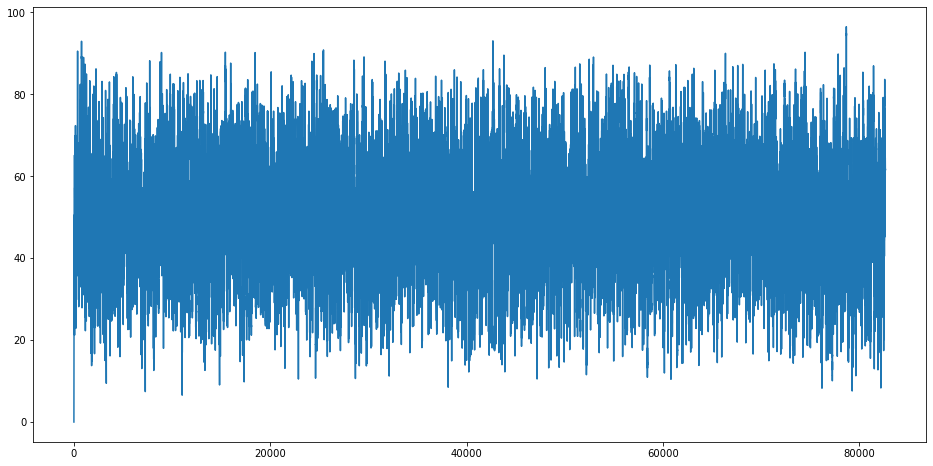

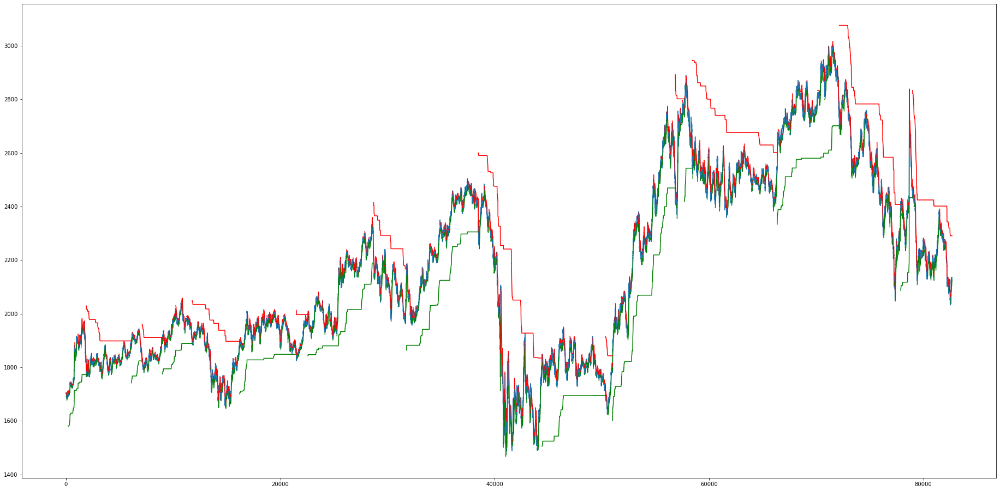

2018-01-01 09:20:00
2018-05-03 15:25:00
2018-06-26 13:25:00
2018-11-19 10:05:00
2019-03-20 15:20:00
2019-09-23 15:10:00
2020-06-16 09:25:00
['2018-01-01 09:20:00', '2018-05-03 15:25:00', '2018-06-26 13:25:00', '2018-11-19 10:05:00', '2019-03-20 15:20:00', '2019-09-23 15:10:00', '2020-06-16 09:25:00']
HDFCBANK


					HDFCBANK


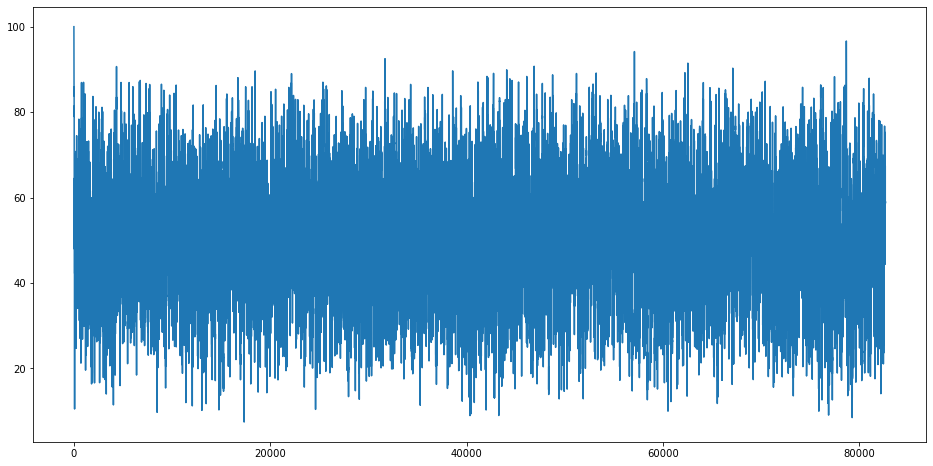

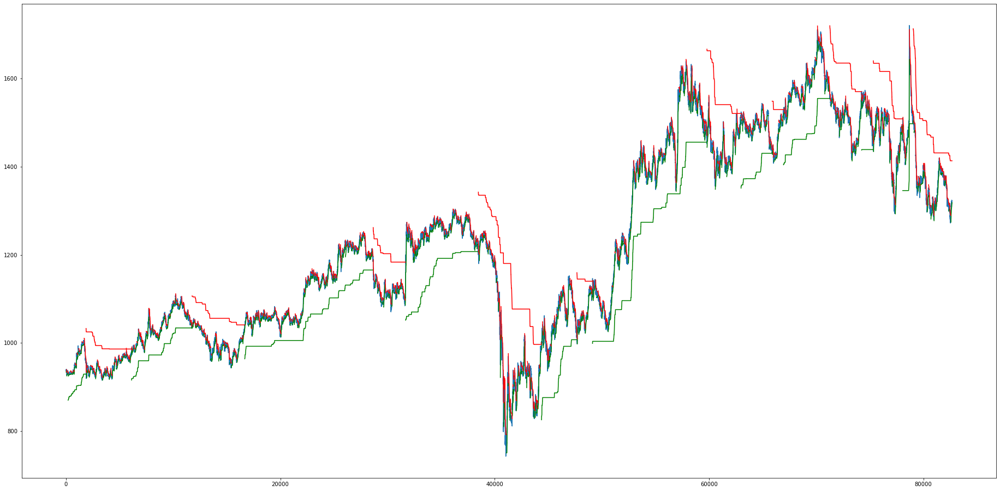

2018-01-03 09:15:00
2018-05-03 09:15:00
2018-11-28 14:50:00
2019-09-23 14:20:00
2020-06-03 14:55:00
2020-08-31 11:50:00
2021-06-03 09:25:00
2021-08-16 13:40:00
2022-01-07 10:00:00
2022-03-28 09:15:00
['2018-01-03 09:15:00', '2018-05-03 09:15:00', '2018-11-28 14:50:00', '2019-09-23 14:20:00', '2020-06-03 14:55:00', '2020-08-31 11:50:00', '2021-06-03 09:25:00', '2021-08-16 13:40:00', '2022-01-07 10:00:00', '2022-03-28 09:15:00']
HDFCLIFE


					HDFCLIFE


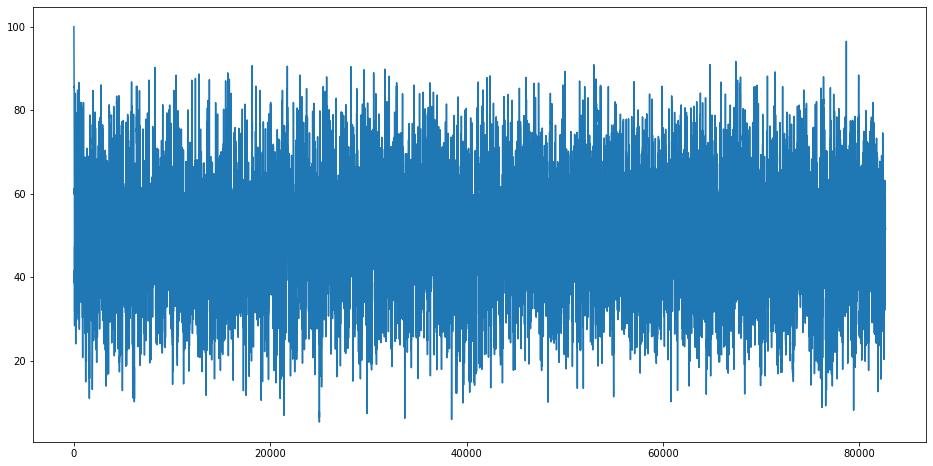

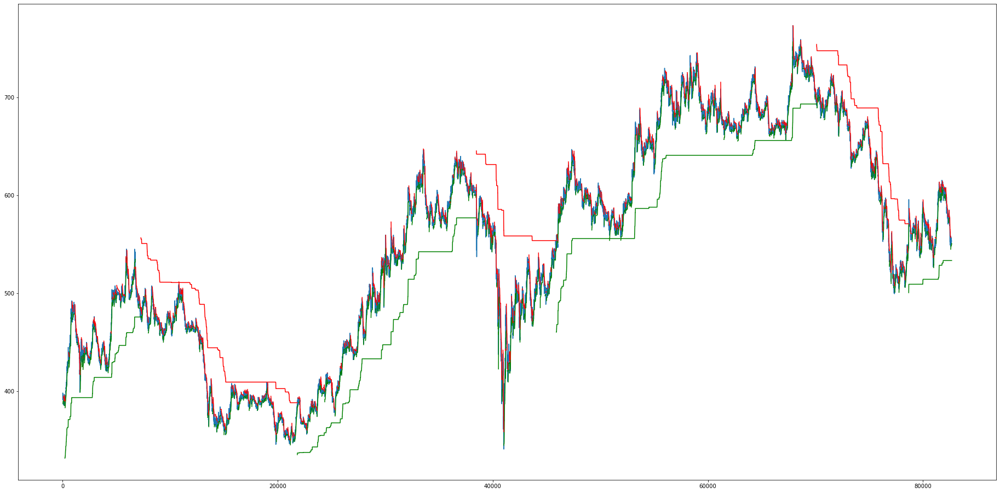

2018-01-01 14:00:00
2019-03-07 09:50:00
2020-07-01 13:55:00
2022-04-04 12:30:00
['2018-01-01 14:00:00', '2019-03-07 09:50:00', '2020-07-01 13:55:00', '2022-04-04 12:30:00']
HEROMOTOCO


					HEROMOTOCO


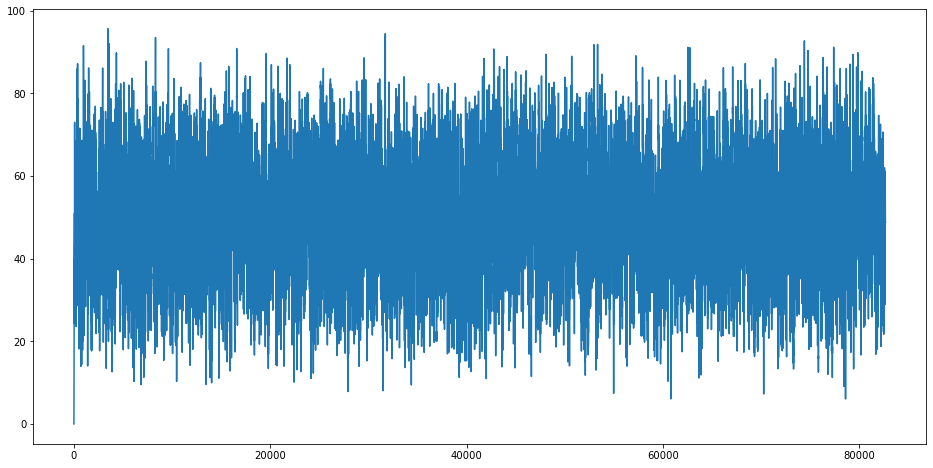

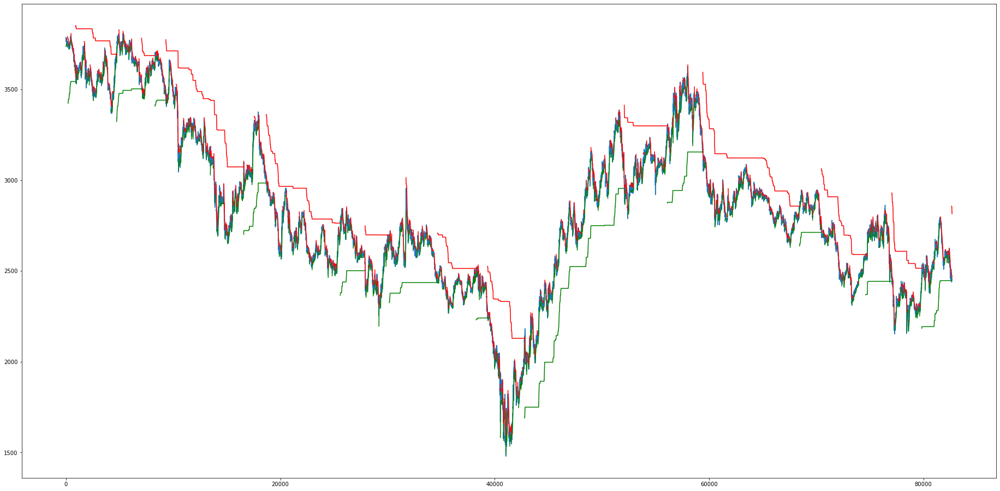

2018-01-01 09:20:00
2018-04-06 10:30:00
2018-06-14 09:25:00
2018-11-28 13:35:00
2019-05-23 12:25:00
2019-08-22 09:20:00
2020-01-31 09:15:00
2020-05-13 15:25:00
2021-01-13 10:25:00
2021-09-15 15:25:00
2022-01-13 10:05:00
2022-04-28 11:45:00
['2018-01-01 09:20:00', '2018-04-06 10:30:00', '2018-06-14 09:25:00', '2018-11-28 13:35:00', '2019-05-23 12:25:00', '2019-08-22 09:20:00', '2020-01-31 09:15:00', '2020-05-13 15:25:00', '2021-01-13 10:25:00', '2021-09-15 15:25:00', '2022-01-13 10:05:00', '2022-04-28 11:45:00']
HINDALCO


					HINDALCO


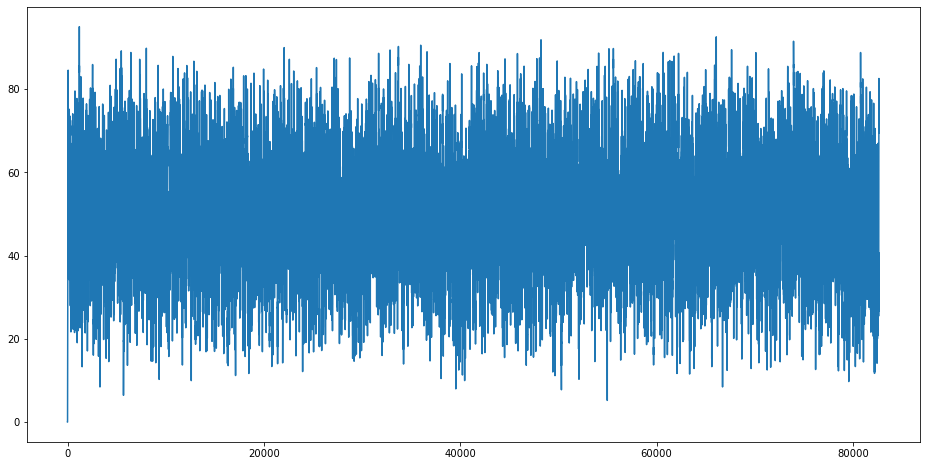

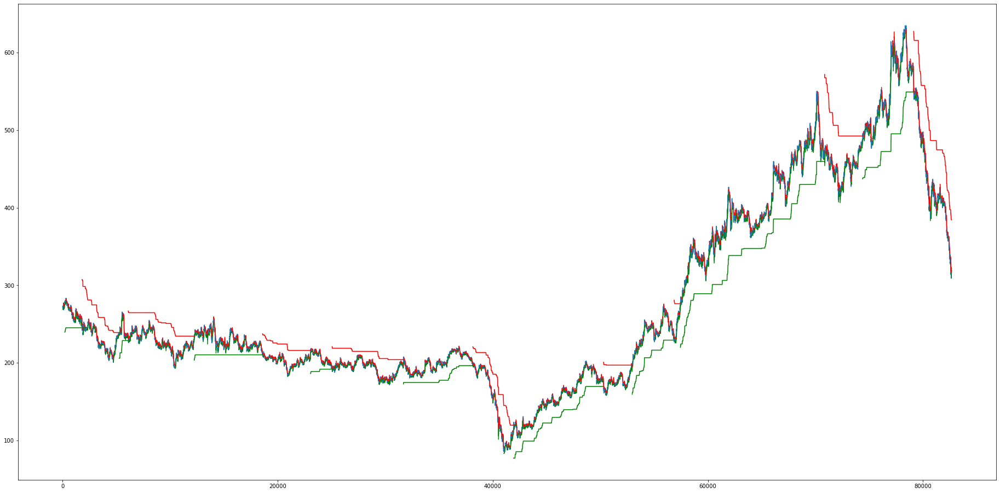

2018-01-01 09:20:00
2018-04-16 10:50:00
2018-08-28 14:30:00
2019-04-01 15:00:00
2019-09-20 14:30:00
2020-04-15 14:00:00
2020-11-11 13:15:00
2021-02-09 12:05:00
2022-01-10 11:35:00
['2018-01-01 09:20:00', '2018-04-16 10:50:00', '2018-08-28 14:30:00', '2019-04-01 15:00:00', '2019-09-20 14:30:00', '2020-04-15 14:00:00', '2020-11-11 13:15:00', '2021-02-09 12:05:00', '2022-01-10 11:35:00']
HINDUNILVR


					HINDUNILVR


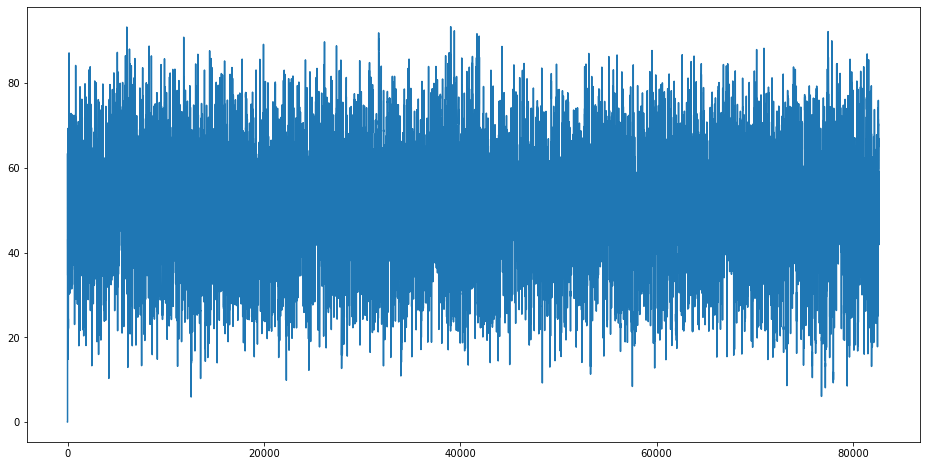

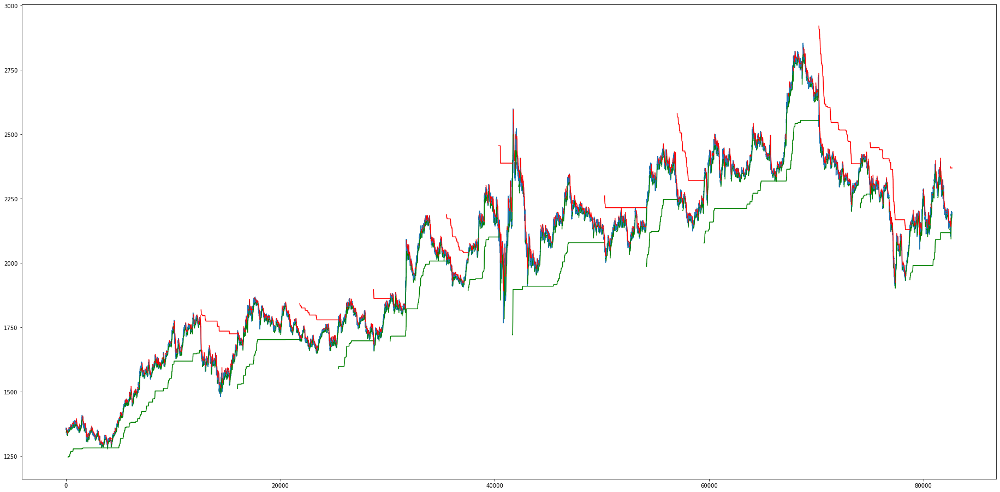

2018-01-01 09:20:00
2018-11-14 15:05:00
2019-05-23 09:15:00
2019-08-22 15:25:00
2020-01-16 13:00:00
2020-04-08 12:30:00
2020-12-08 11:10:00
2021-03-22 12:15:00
2022-01-04 14:25:00
2022-04-05 15:10:00
['2018-01-01 09:20:00', '2018-11-14 15:05:00', '2019-05-23 09:15:00', '2019-08-22 15:25:00', '2020-01-16 13:00:00', '2020-04-08 12:30:00', '2020-12-08 11:10:00', '2021-03-22 12:15:00', '2022-01-04 14:25:00', '2022-04-05 15:10:00']
ICICIBANK


					ICICIBANK


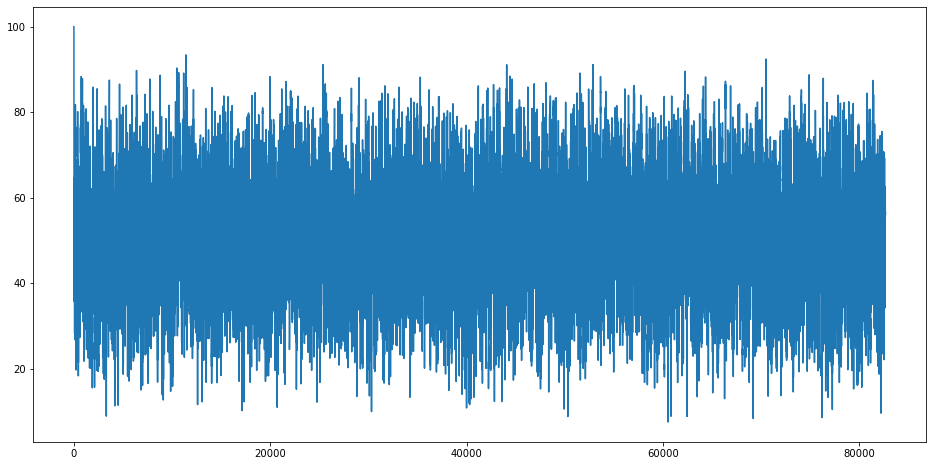

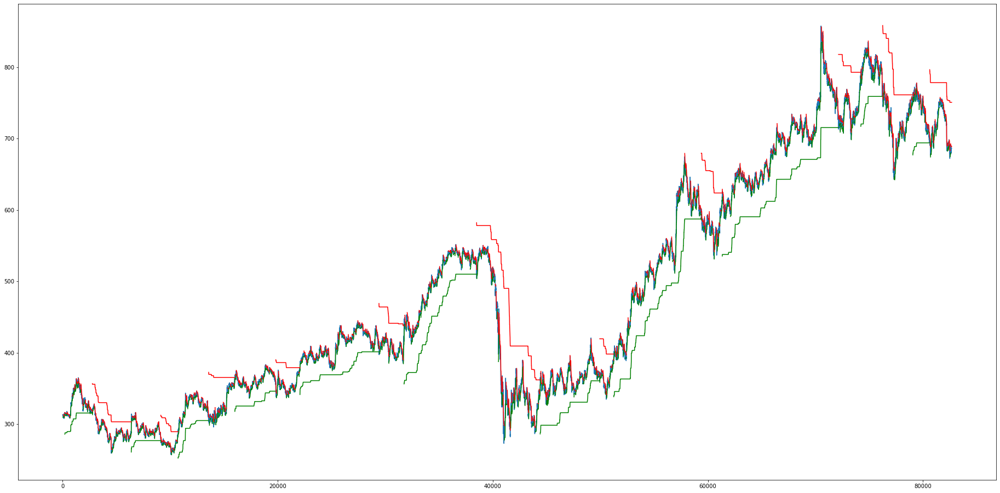

2018-01-01 12:15:00
2018-05-08 14:35:00
2018-07-31 10:00:00
2018-11-14 14:05:00
2019-03-13 10:40:00
2019-09-24 09:20:00
2020-06-03 14:45:00
2020-10-12 13:15:00
2021-04-29 09:50:00
2022-01-05 14:55:00
2022-04-11 14:40:00
['2018-01-01 12:15:00', '2018-05-08 14:35:00', '2018-07-31 10:00:00', '2018-11-14 14:05:00', '2019-03-13 10:40:00', '2019-09-24 09:20:00', '2020-06-03 14:45:00', '2020-10-12 13:15:00', '2021-04-29 09:50:00', '2022-01-05 14:55:00', '2022-04-11 14:40:00']
ITC


					ITC


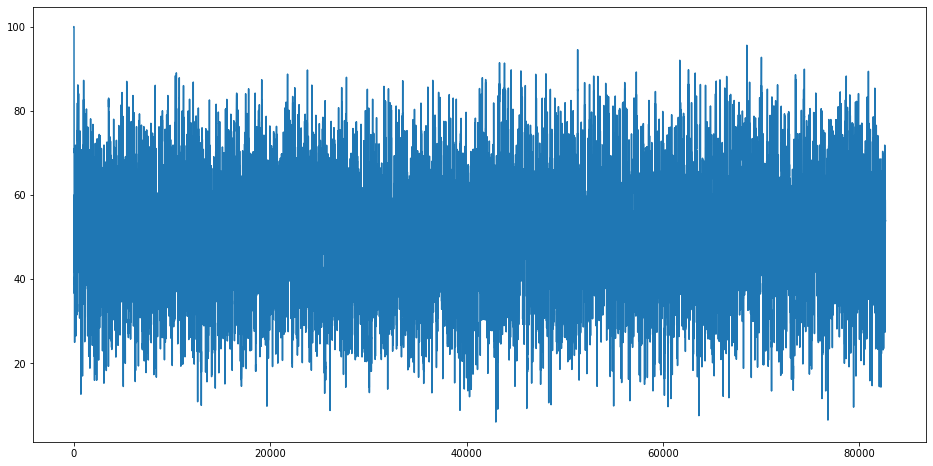

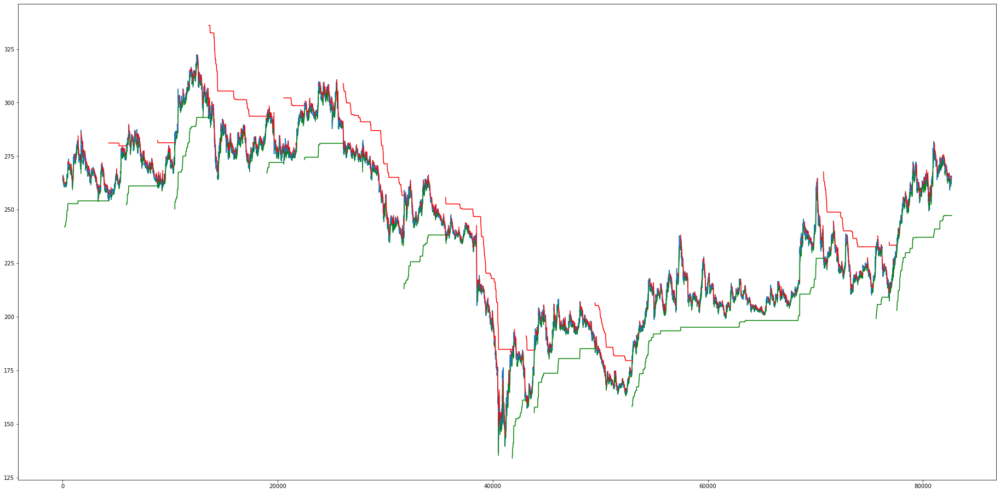

2018-01-01 13:20:00
2018-04-30 12:50:00
2018-07-23 14:10:00
2019-01-15 09:15:00
2019-03-20 10:20:00
2019-09-23 13:25:00
2020-04-13 11:25:00
2020-05-22 12:05:00
2020-11-12 13:35:00
2022-02-03 12:10:00
['2018-01-01 13:20:00', '2018-04-30 12:50:00', '2018-07-23 14:10:00', '2019-01-15 09:15:00', '2019-03-20 10:20:00', '2019-09-23 13:25:00', '2020-04-13 11:25:00', '2020-05-22 12:05:00', '2020-11-12 13:35:00', '2022-02-03 12:10:00']
INDUSINDBK


					INDUSINDBK


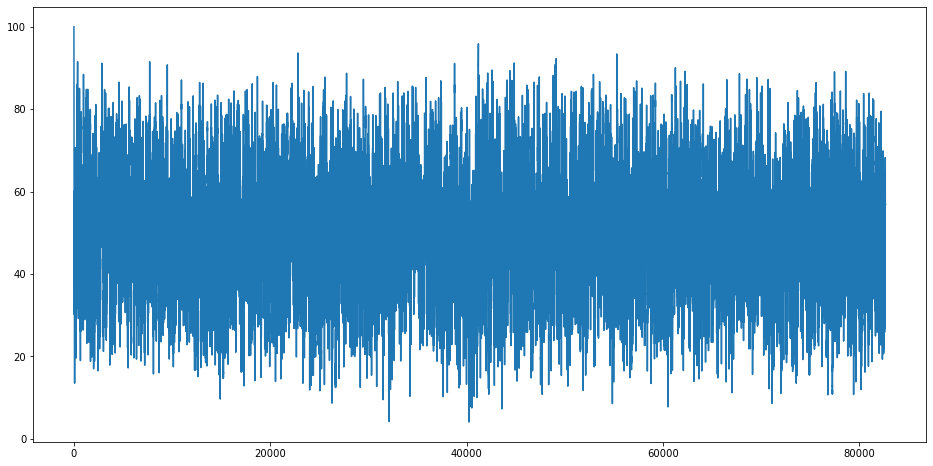

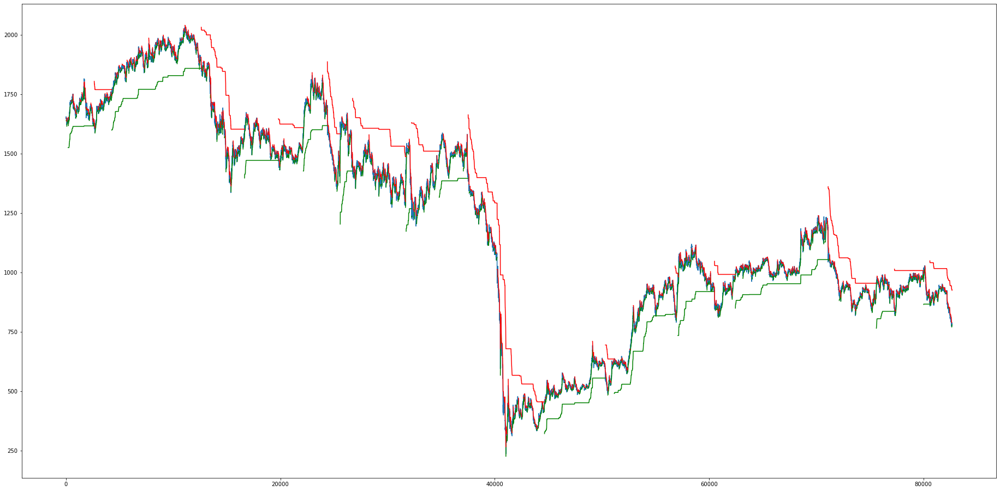

2018-01-01 13:25:00
2018-03-26 11:40:00
2018-11-28 11:10:00
2019-03-14 15:15:00
2019-05-23 14:00:00
2019-09-23 15:00:00
2019-11-29 13:55:00
2020-06-08 12:50:00
['2018-01-01 13:25:00', '2018-03-26 11:40:00', '2018-11-28 11:10:00', '2019-03-14 15:15:00', '2019-05-23 14:00:00', '2019-09-23 15:00:00', '2019-11-29 13:55:00', '2020-06-08 12:50:00']
INFY


					INFY


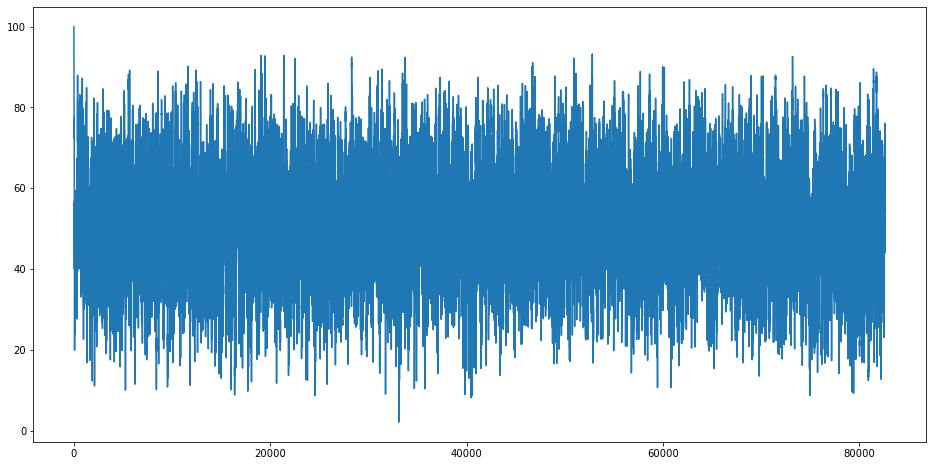

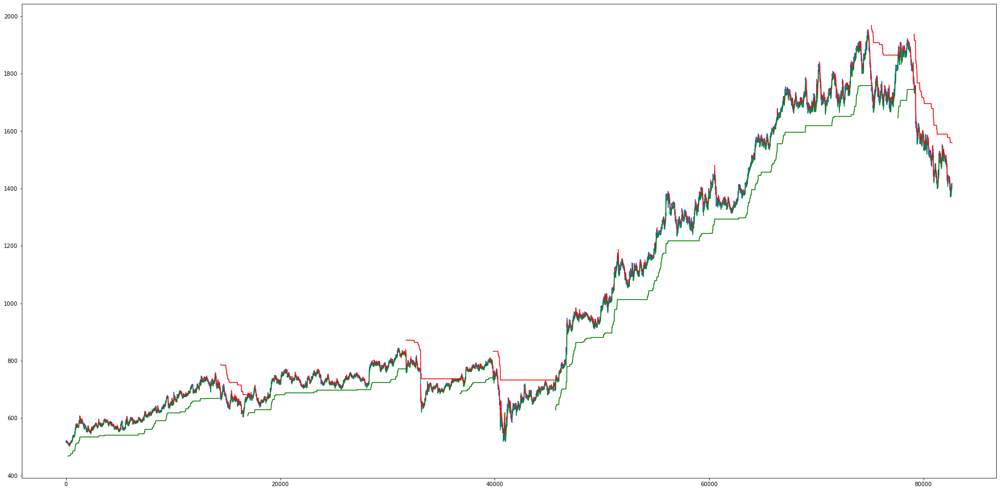

2018-01-01 14:50:00
2018-12-04 15:25:00
2020-01-02 12:40:00
2020-07-02 09:45:00
2022-03-16 09:30:00
['2018-01-01 14:50:00', '2018-12-04 15:25:00', '2020-01-02 12:40:00', '2020-07-02 09:45:00', '2022-03-16 09:30:00']
JSWSTEEL


					JSWSTEEL


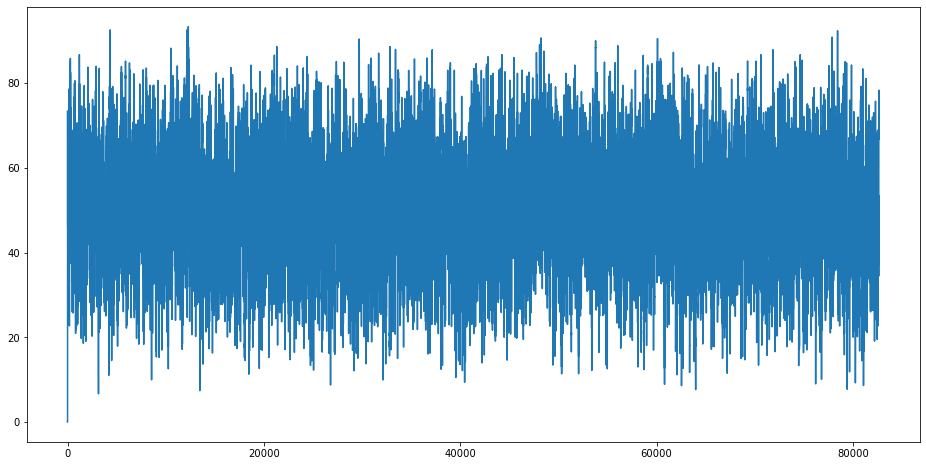

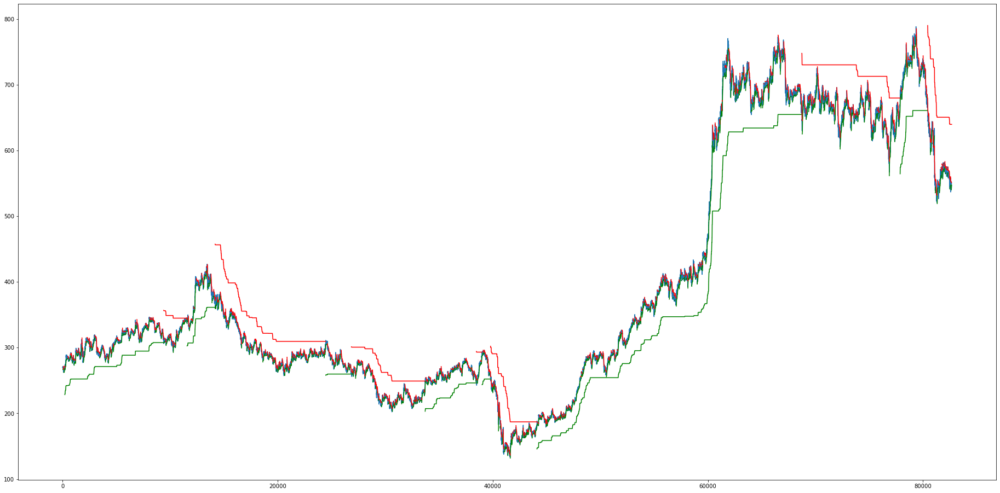

2018-01-01 09:50:00
2018-08-13 13:10:00
2019-05-02 12:55:00
2019-11-04 15:00:00
2020-02-20 14:30:00
2020-05-28 13:30:00
2022-03-21 12:40:00
['2018-01-01 09:50:00', '2018-08-13 13:10:00', '2019-05-02 12:55:00', '2019-11-04 15:00:00', '2020-02-20 14:30:00', '2020-05-28 13:30:00', '2022-03-21 12:40:00']
KOTAKBANK


					KOTAKBANK


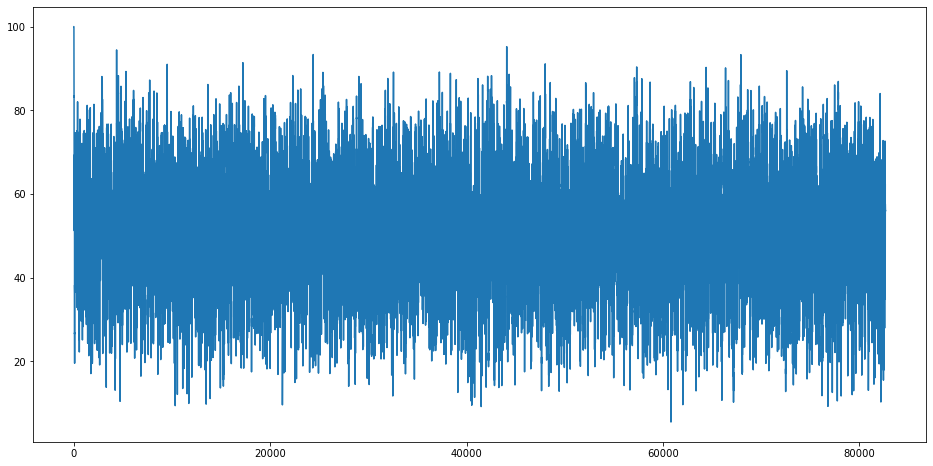

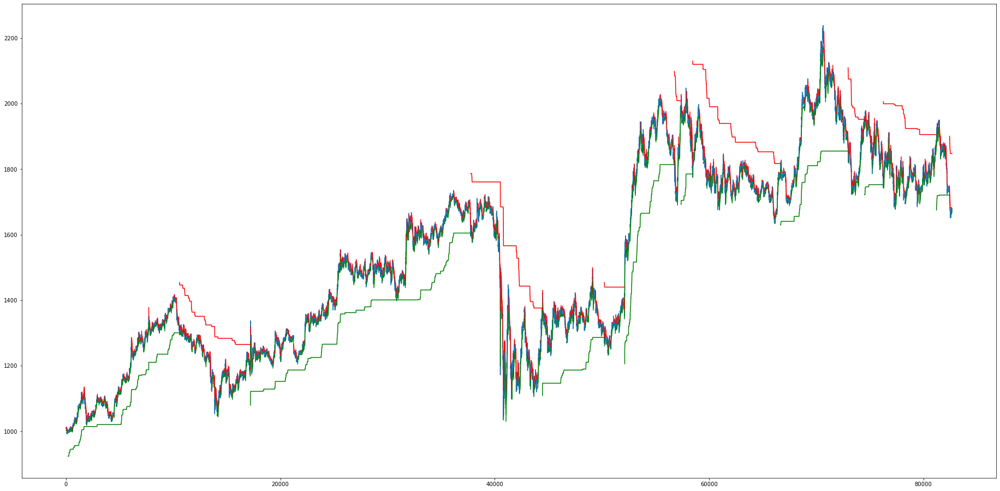

2018-01-01 14:55:00
2018-12-07 15:05:00
2020-06-08 11:30:00
2020-10-28 09:30:00
2021-02-09 14:25:00
2021-08-10 14:10:00
2022-01-11 12:20:00
2022-05-25 14:55:00
['2018-01-01 14:55:00', '2018-12-07 15:05:00', '2020-06-08 11:30:00', '2020-10-28 09:30:00', '2021-02-09 14:25:00', '2021-08-10 14:10:00', '2022-01-11 12:20:00', '2022-05-25 14:55:00']
LT


					LT


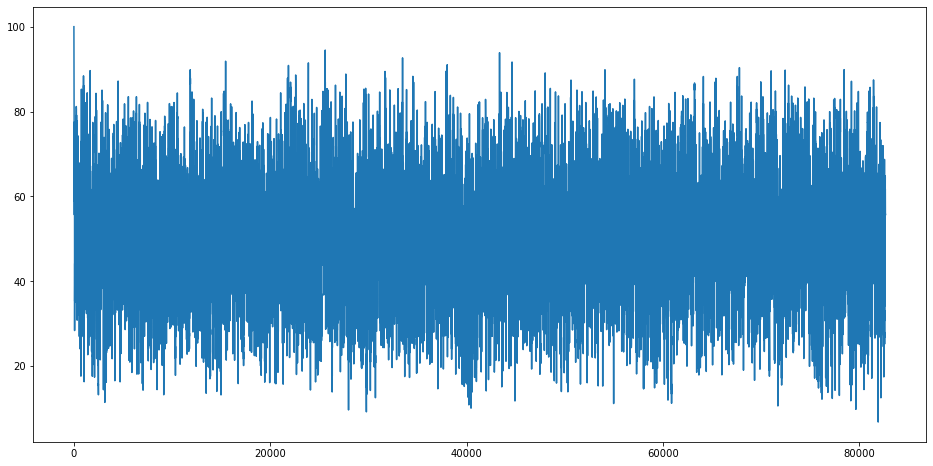

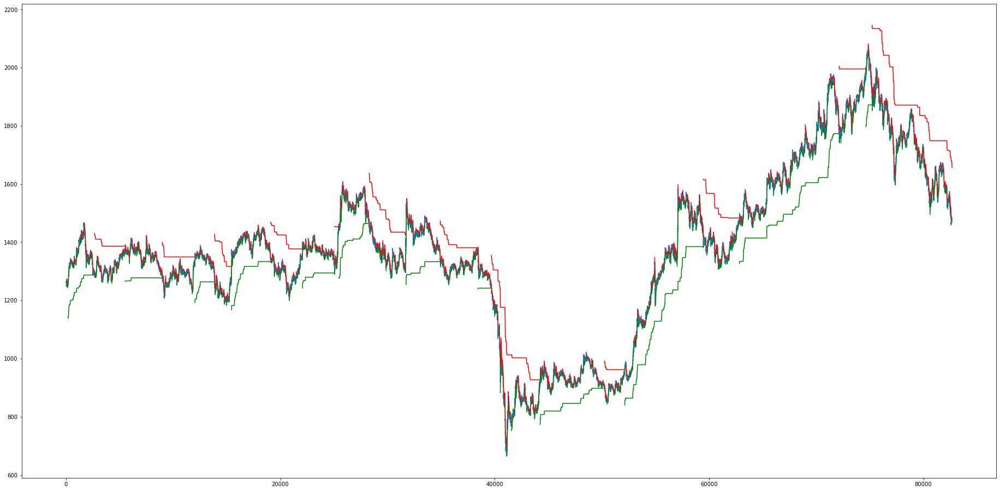

2018-01-01 15:00:00
2018-04-30 09:15:00
2018-08-23 15:25:00
2018-11-01 14:20:00
2019-03-12 14:50:00
2019-05-21 09:40:00
2019-09-23 14:40:00
2021-01-08 10:15:00
2021-05-28 11:00:00
2022-01-14 15:25:00
['2018-01-01 15:00:00', '2018-04-30 09:15:00', '2018-08-23 15:25:00', '2018-11-01 14:20:00', '2019-03-12 14:50:00', '2019-05-21 09:40:00', '2019-09-23 14:40:00', '2021-01-08 10:15:00', '2021-05-28 11:00:00', '2022-01-14 15:25:00']
M&M


					M&M


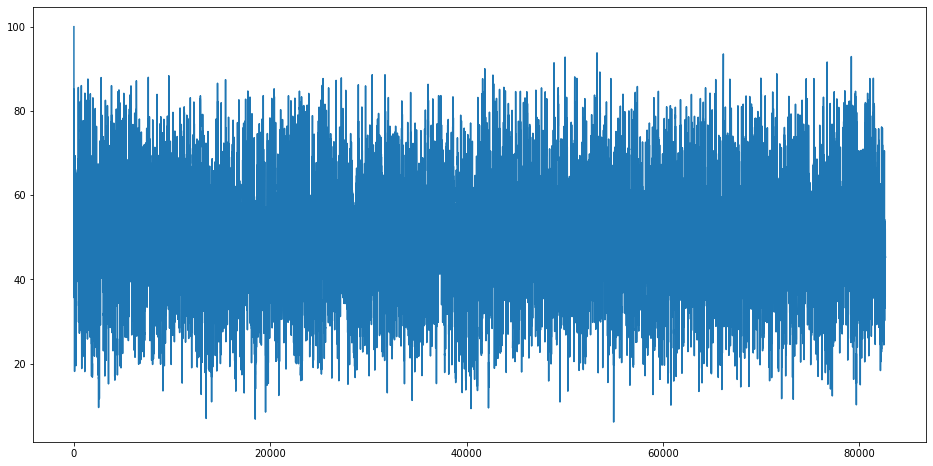

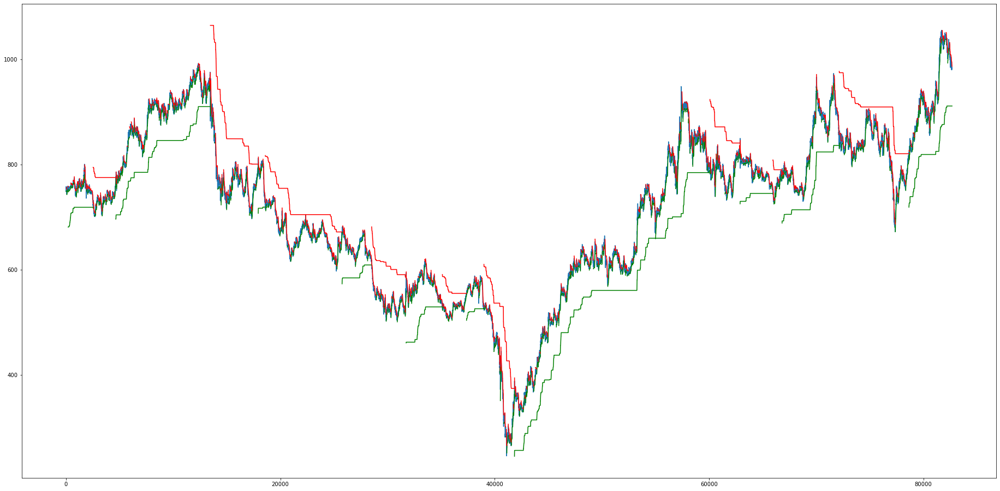

2018-01-01 13:10:00
2018-04-04 11:45:00
2018-12-21 10:30:00
2019-05-28 09:40:00
2019-09-23 10:05:00
2020-01-15 09:20:00
2020-04-15 11:20:00
2021-10-04 11:00:00
2022-04-04 09:50:00
['2018-01-01 13:10:00', '2018-04-04 11:45:00', '2018-12-21 10:30:00', '2019-05-28 09:40:00', '2019-09-23 10:05:00', '2020-01-15 09:20:00', '2020-04-15 11:20:00', '2021-10-04 11:00:00', '2022-04-04 09:50:00']
MARUTI


					MARUTI


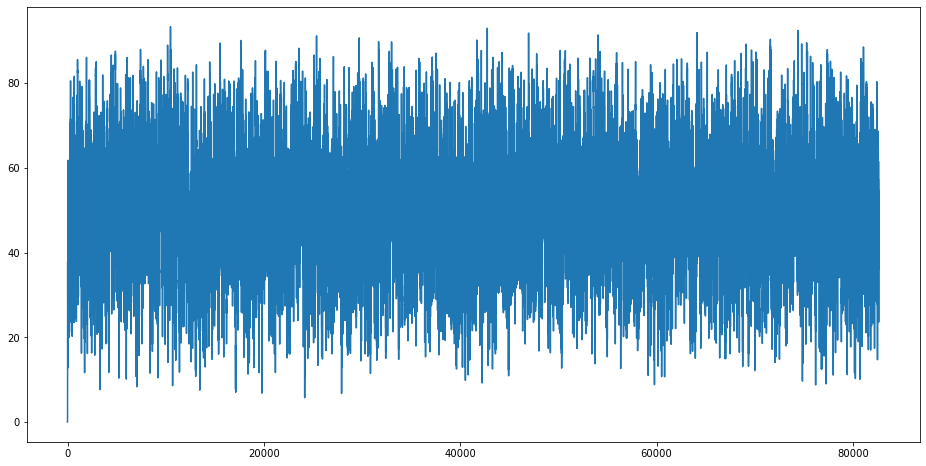

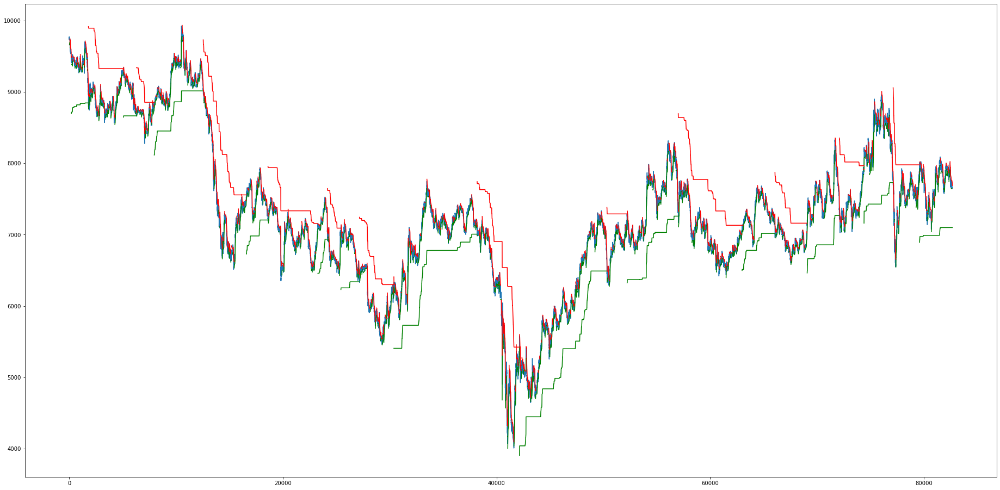

2018-01-01 09:20:00
2018-04-11 15:20:00
2018-06-06 14:00:00
2018-11-28 11:25:00
2019-04-04 11:55:00
2019-05-21 10:40:00
2019-08-27 14:10:00
2020-04-22 13:25:00
['2018-01-01 09:20:00', '2018-04-11 15:20:00', '2018-06-06 14:00:00', '2018-11-28 11:25:00', '2019-04-04 11:55:00', '2019-05-21 10:40:00', '2019-08-27 14:10:00', '2020-04-22 13:25:00']
NTPC


					NTPC


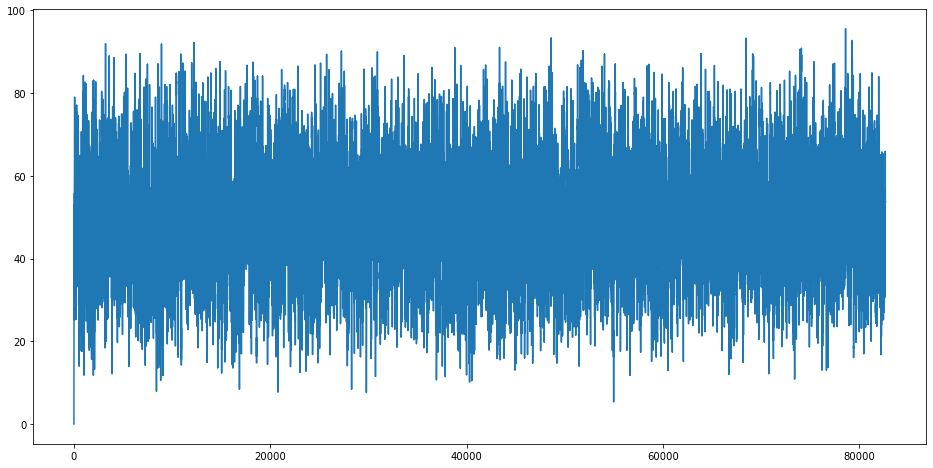

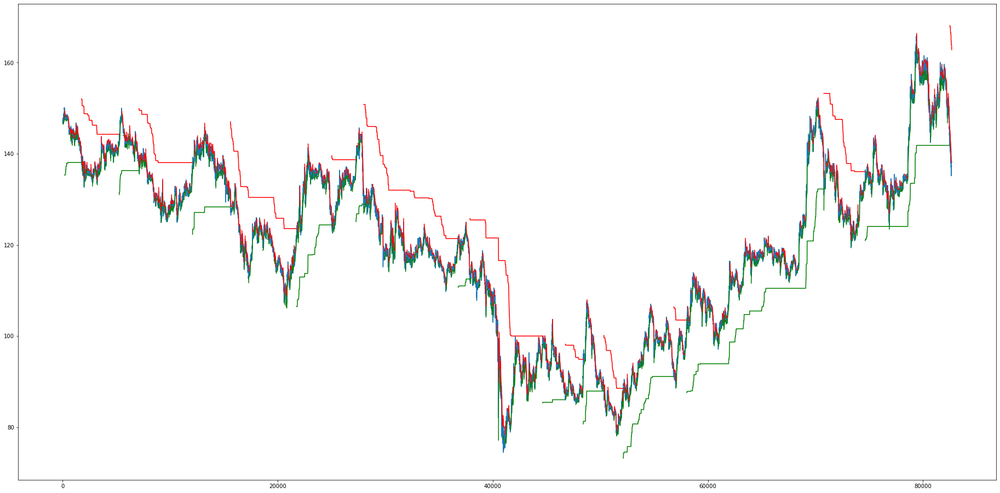

2018-01-01 09:20:00
2018-04-16 11:45:00
2018-08-24 12:50:00
2019-03-07 10:00:00
2019-06-25 15:15:00
2020-01-02 15:25:00
2020-06-08 12:55:00
2020-08-17 15:15:00
2020-10-27 14:30:00
2021-02-19 09:35:00
2022-01-14 09:20:00
['2018-01-01 09:20:00', '2018-04-16 11:45:00', '2018-08-24 12:50:00', '2019-03-07 10:00:00', '2019-06-25 15:15:00', '2020-01-02 15:25:00', '2020-06-08 12:55:00', '2020-08-17 15:15:00', '2020-10-27 14:30:00', '2021-02-19 09:35:00', '2022-01-14 09:20:00']
NESTLEIND


					NESTLEIND


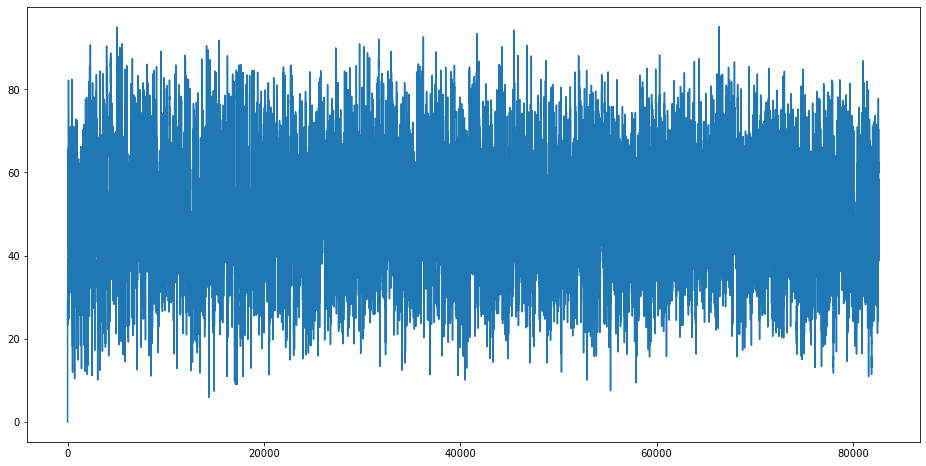

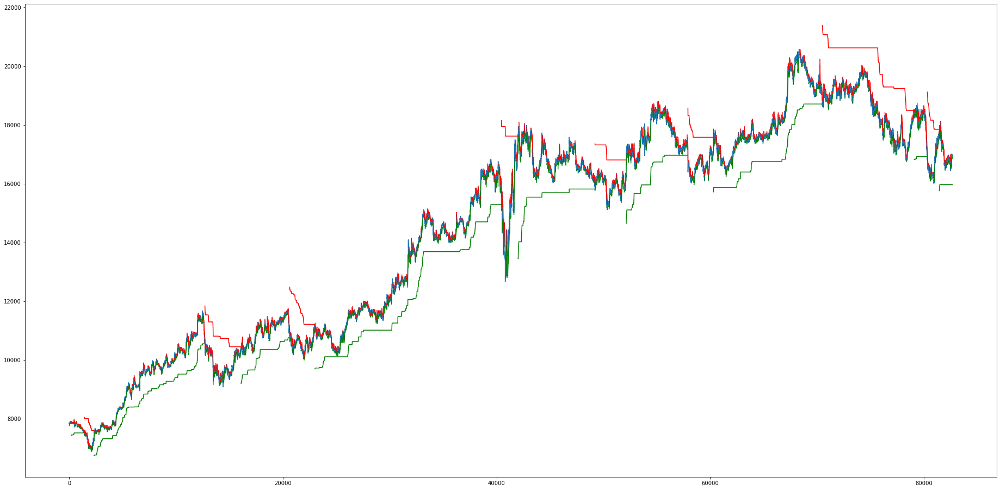

2018-01-01 09:20:00
2018-02-15 14:45:00
2018-11-15 13:15:00
2019-03-29 14:05:00
2020-04-17 11:15:00
2020-10-28 13:55:00
2021-04-09 11:00:00
2022-04-11 14:50:00
2022-05-30 12:40:00
['2018-01-01 09:20:00', '2018-02-15 14:45:00', '2018-11-15 13:15:00', '2019-03-29 14:05:00', '2020-04-17 11:15:00', '2020-10-28 13:55:00', '2021-04-09 11:00:00', '2022-04-11 14:50:00', '2022-05-30 12:40:00']
ONGC


					ONGC


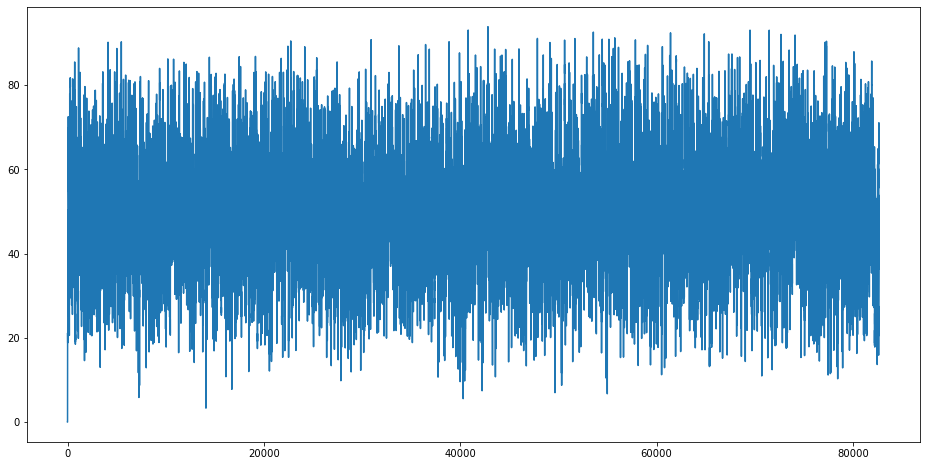

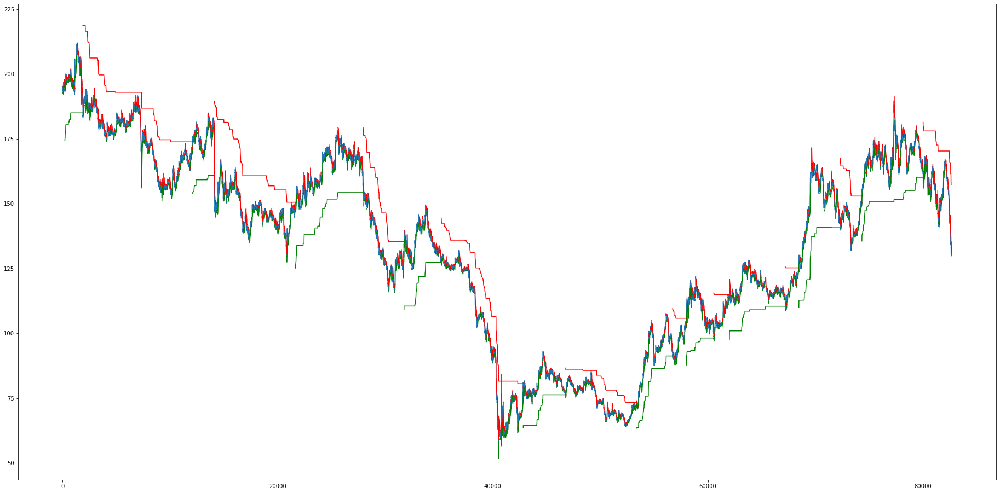

2018-01-01 09:20:00
2018-08-24 14:25:00
2019-03-01 13:50:00
2019-09-23 14:50:00
2020-05-05 14:20:00
2020-11-19 13:40:00
2021-02-22 14:30:00
2021-05-18 13:35:00
['2018-01-01 09:20:00', '2018-08-24 14:25:00', '2019-03-01 13:50:00', '2019-09-23 14:50:00', '2020-05-05 14:20:00', '2020-11-19 13:40:00', '2021-02-22 14:30:00', '2021-05-18 13:35:00']
POWERGRID


					POWERGRID


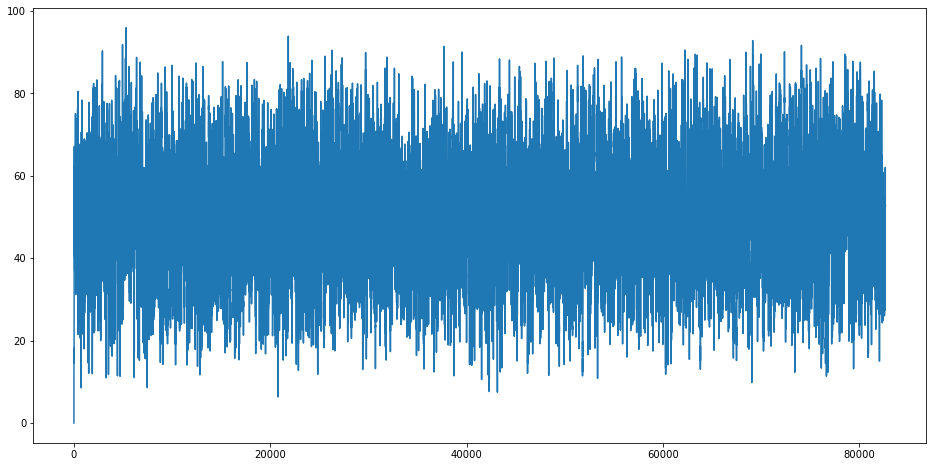

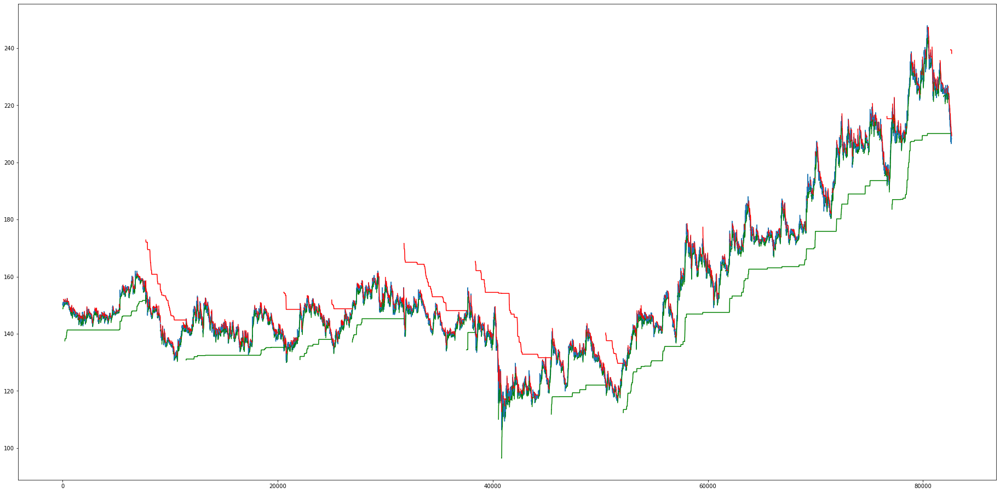

2018-01-01 09:20:00
2018-08-24 09:20:00
2019-03-12 12:00:00
2019-06-19 15:05:00
2020-01-16 14:20:00
2020-06-24 09:45:00
2020-10-27 12:00:00
['2018-01-01 09:20:00', '2018-08-24 09:20:00', '2019-03-12 12:00:00', '2019-06-19 15:05:00', '2020-01-16 14:20:00', '2020-06-24 09:45:00', '2020-10-27 12:00:00']
RELIANCE


					RELIANCE


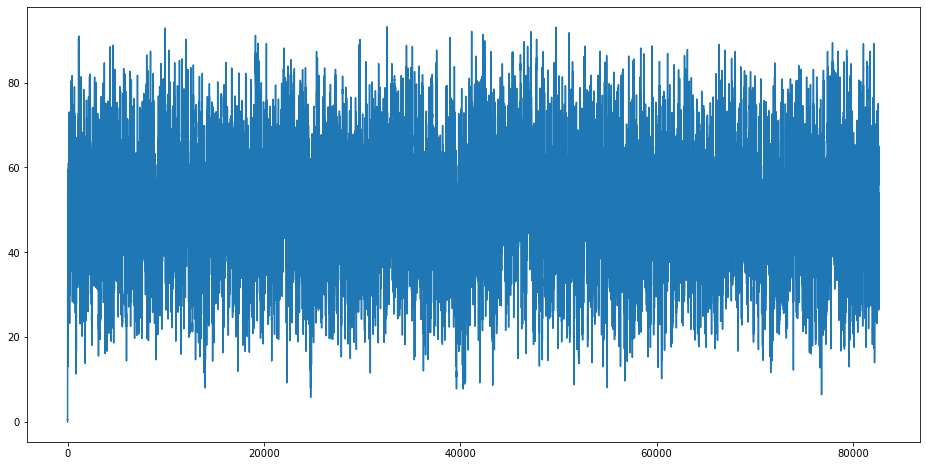

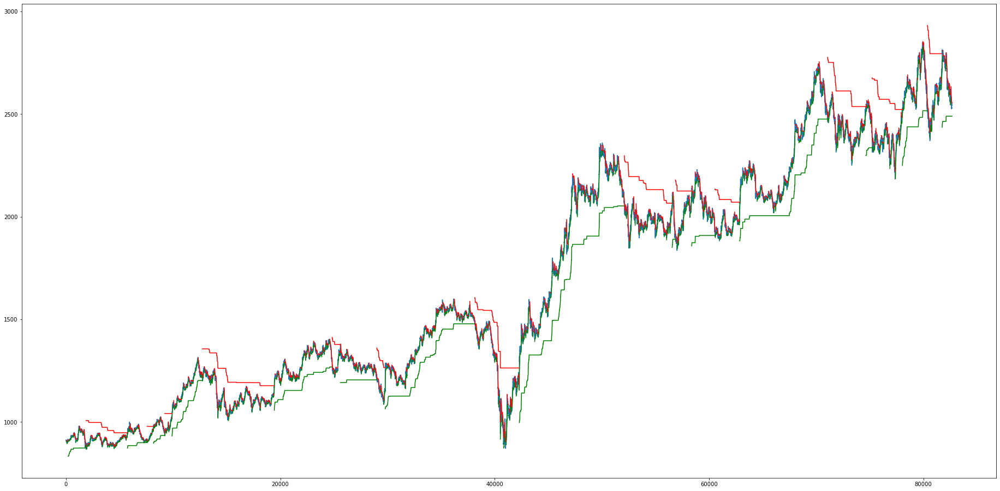

2018-01-01 09:20:00
2018-04-25 14:35:00
2018-06-12 11:20:00
2018-07-12 15:05:00
2019-01-22 09:25:00
2019-06-21 09:40:00
2019-08-14 09:45:00
2020-04-23 13:30:00
2021-01-21 14:15:00
2021-03-03 14:20:00
2021-05-31 13:25:00
2022-01-13 10:05:00
2022-03-23 12:00:00
2022-06-03 14:15:00
['2018-01-01 09:20:00', '2018-04-25 14:35:00', '2018-06-12 11:20:00', '2018-07-12 15:05:00', '2019-01-22 09:25:00', '2019-06-21 09:40:00', '2019-08-14 09:45:00', '2020-04-23 13:30:00', '2021-01-21 14:15:00', '2021-03-03 14:20:00', '2021-05-31 13:25:00', '2022-01-13 10:05:00', '2022-03-23 12:00:00', '2022-06-03 14:15:00']
SBILIFE


					SBILIFE


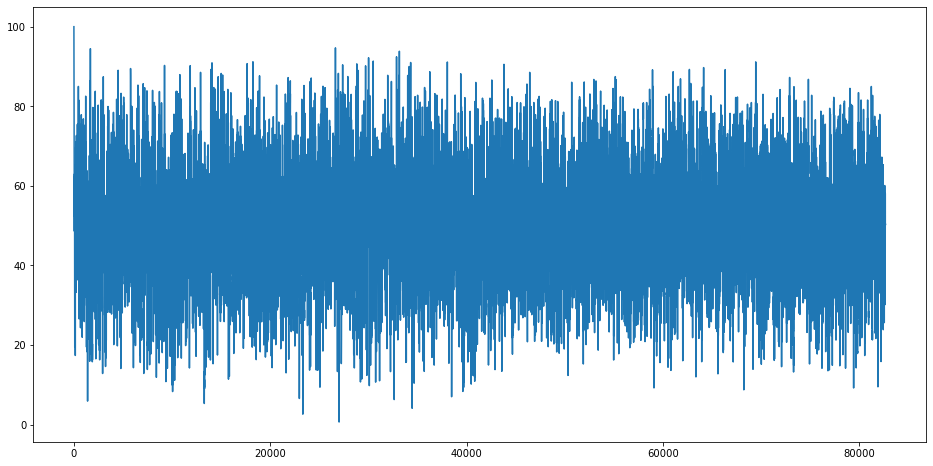

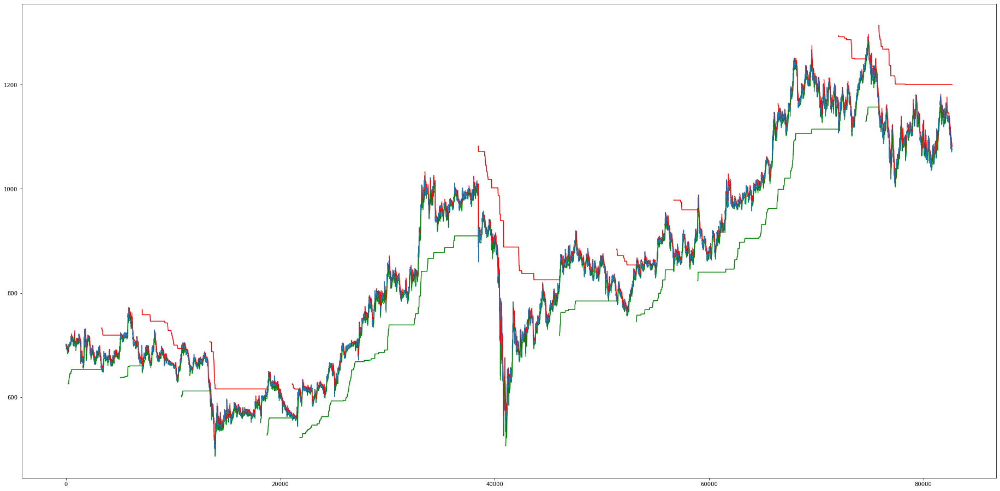

2018-01-02 09:20:00
2018-04-12 12:35:00
2018-07-30 10:20:00
2019-01-08 14:00:00
2020-07-06 14:20:00
2020-11-18 11:05:00
2021-03-09 15:20:00
2022-01-13 13:05:00
['2018-01-02 09:20:00', '2018-04-12 12:35:00', '2018-07-30 10:20:00', '2019-01-08 14:00:00', '2020-07-06 14:20:00', '2020-11-18 11:05:00', '2021-03-09 15:20:00', '2022-01-13 13:05:00']
SBIN


					SBIN


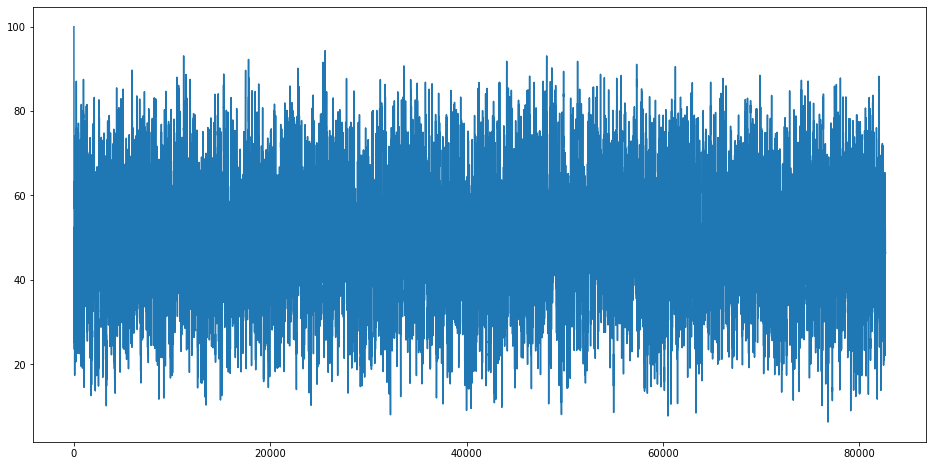

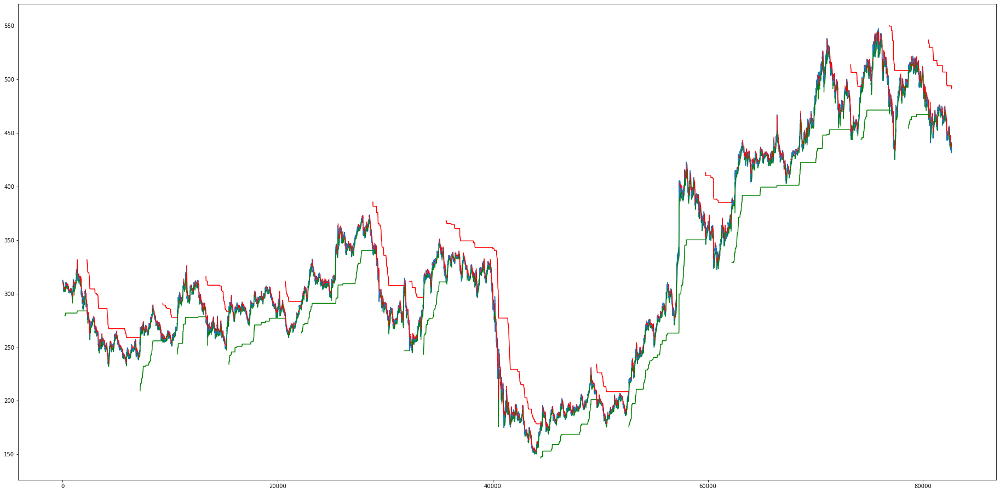

2018-01-05 09:15:00
2018-05-23 13:40:00
2018-07-27 13:05:00
2018-11-02 13:45:00
2019-03-14 11:45:00
2019-09-24 10:45:00
2019-11-04 13:05:00
2020-06-03 14:55:00
2020-11-06 10:55:00
2021-05-18 12:25:00
2022-01-06 11:15:00
2022-04-05 09:15:00
['2018-01-05 09:15:00', '2018-05-23 13:40:00', '2018-07-27 13:05:00', '2018-11-02 13:45:00', '2019-03-14 11:45:00', '2019-09-24 10:45:00', '2019-11-04 13:05:00', '2020-06-03 14:55:00', '2020-11-06 10:55:00', '2021-05-18 12:25:00', '2022-01-06 11:15:00', '2022-04-05 09:15:00']
SHREECEM


					SHREECEM


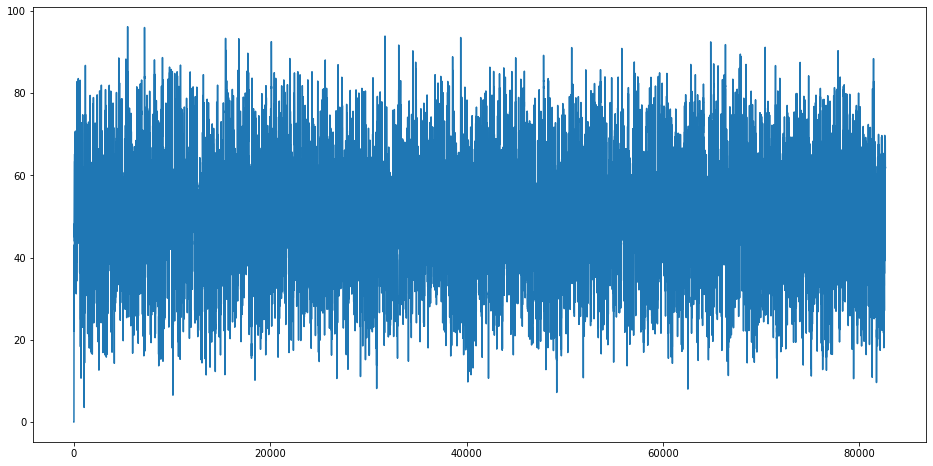

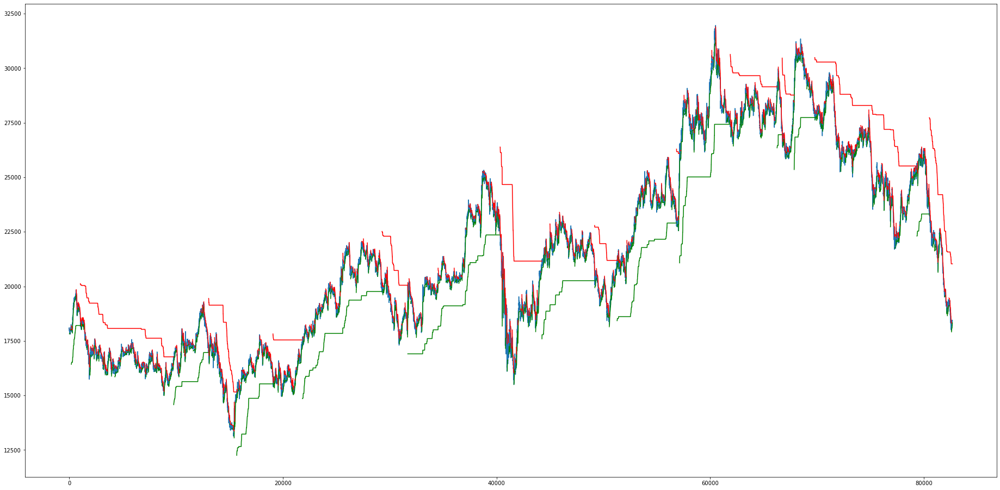

2018-01-01 09:20:00
2018-07-13 09:20:00
2018-11-06 11:25:00
2019-03-07 12:20:00
2019-09-24 09:30:00
2020-06-01 13:40:00
2020-10-12 09:50:00
2022-04-20 10:10:00
['2018-01-01 09:20:00', '2018-07-13 09:20:00', '2018-11-06 11:25:00', '2019-03-07 12:20:00', '2019-09-24 09:30:00', '2020-06-01 13:40:00', '2020-10-12 09:50:00', '2022-04-20 10:10:00']
SUNPHARMA


					SUNPHARMA


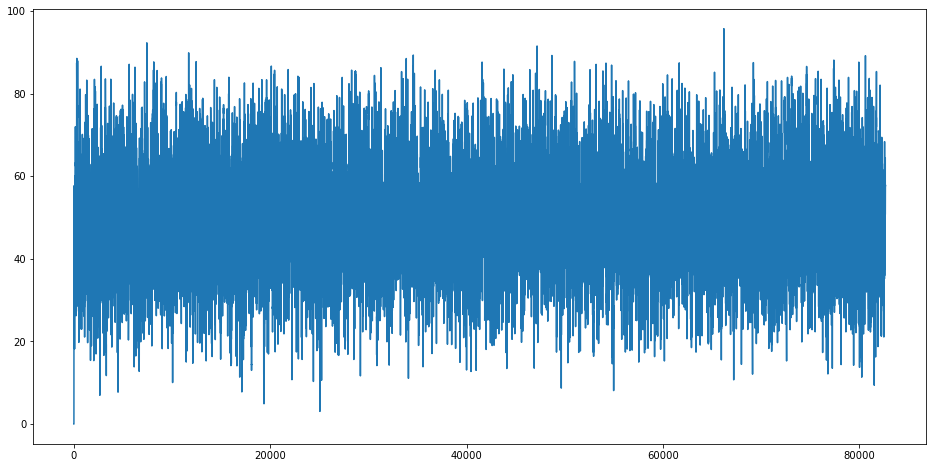

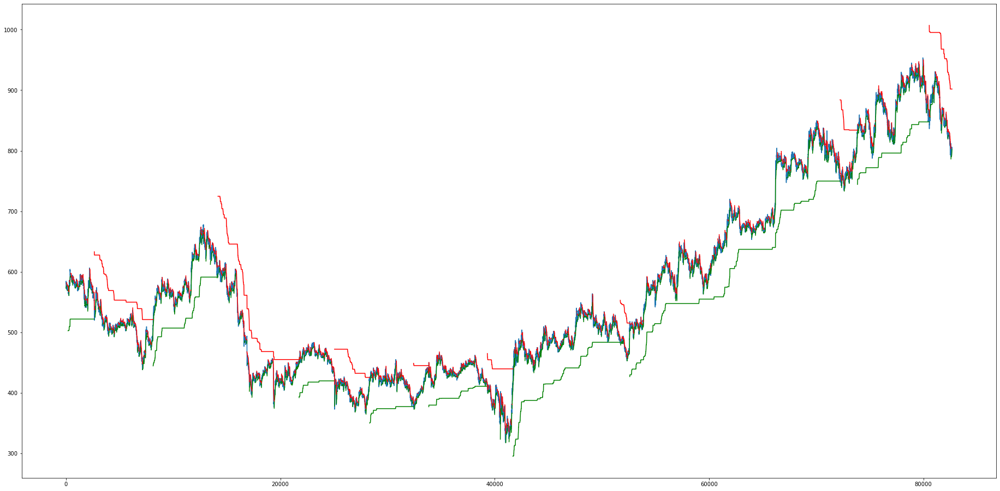

2018-01-01 09:20:00
2018-06-11 12:30:00
2019-03-06 09:30:00
2019-07-15 15:20:00
2019-11-08 10:00:00
2020-04-13 10:00:00
2020-11-04 13:00:00
2022-01-13 09:25:00
['2018-01-01 09:20:00', '2018-06-11 12:30:00', '2019-03-06 09:30:00', '2019-07-15 15:20:00', '2019-11-08 10:00:00', '2020-04-13 10:00:00', '2020-11-04 13:00:00', '2022-01-13 09:25:00']
TATAMOTORS


					TATAMOTORS


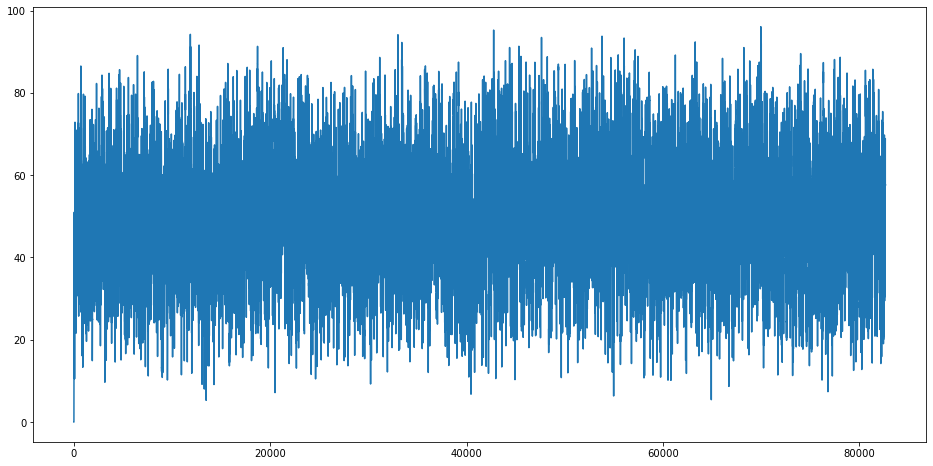

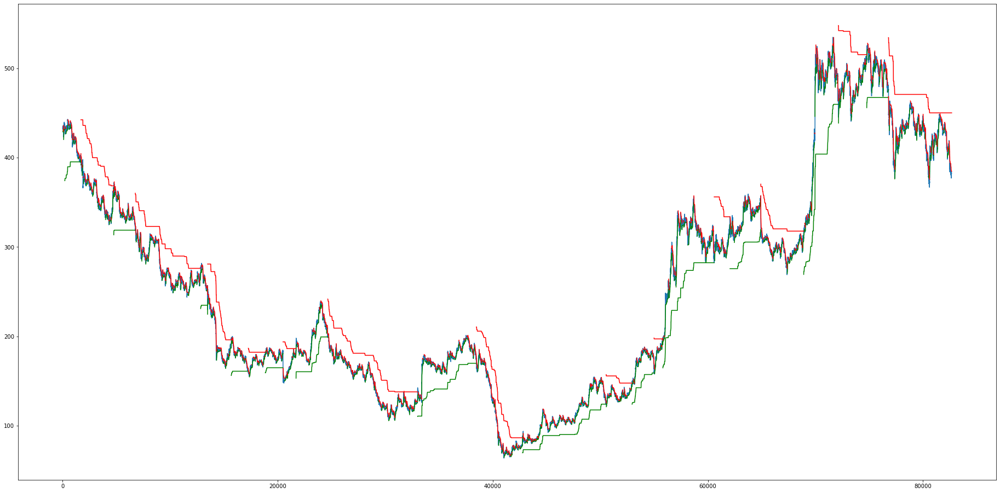

2018-01-01 09:20:00
2018-04-05 14:50:00
2018-09-10 10:25:00
2018-11-06 13:45:00
2019-01-09 14:35:00
2019-03-06 09:15:00
2019-10-18 14:50:00
2020-06-02 13:20:00
2020-11-12 13:15:00
2021-01-07 13:50:00
2021-05-14 09:15:00
2021-09-24 10:10:00
2022-01-18 10:10:00
['2018-01-01 09:20:00', '2018-04-05 14:50:00', '2018-09-10 10:25:00', '2018-11-06 13:45:00', '2019-01-09 14:35:00', '2019-03-06 09:15:00', '2019-10-18 14:50:00', '2020-06-02 13:20:00', '2020-11-12 13:15:00', '2021-01-07 13:50:00', '2021-05-14 09:15:00', '2021-09-24 10:10:00', '2022-01-18 10:10:00']
TATACONSUM


					TATACONSUM


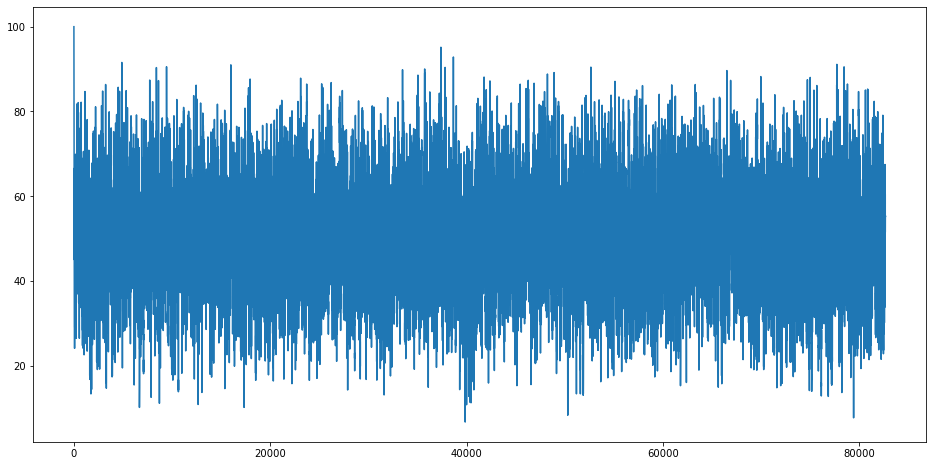

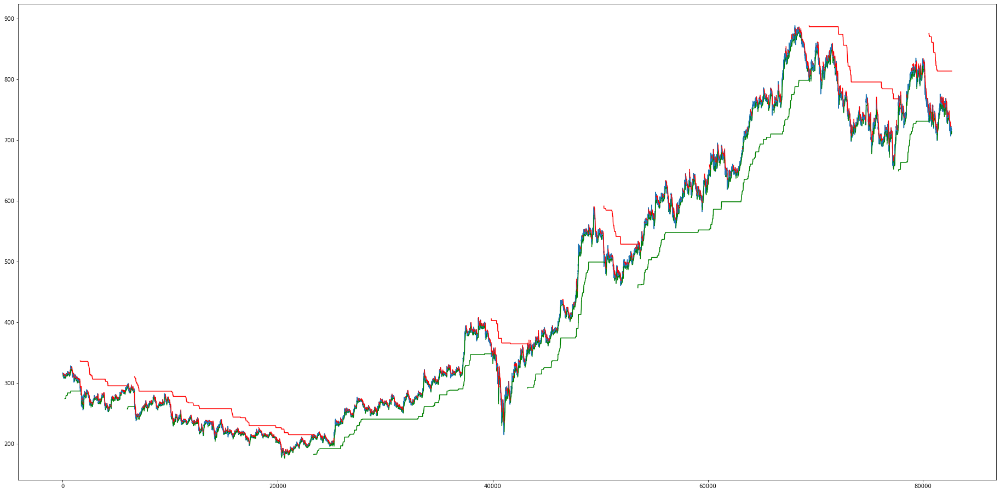

2018-01-01 14:50:00
2018-05-02 11:25:00
2019-04-05 11:25:00
2020-05-11 13:20:00
2020-11-23 12:15:00
2022-03-17 13:30:00
['2018-01-01 14:50:00', '2018-05-02 11:25:00', '2019-04-05 11:25:00', '2020-05-11 13:20:00', '2020-11-23 12:15:00', '2022-03-17 13:30:00']
TATASTEEL


					TATASTEEL


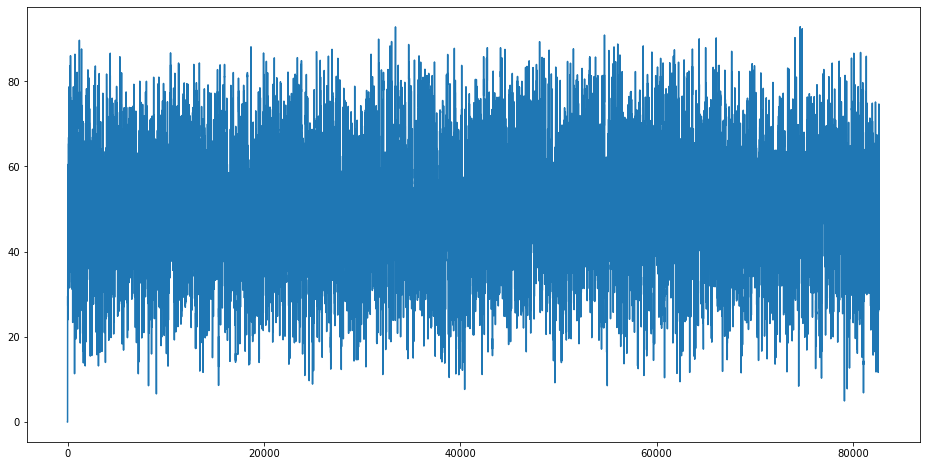

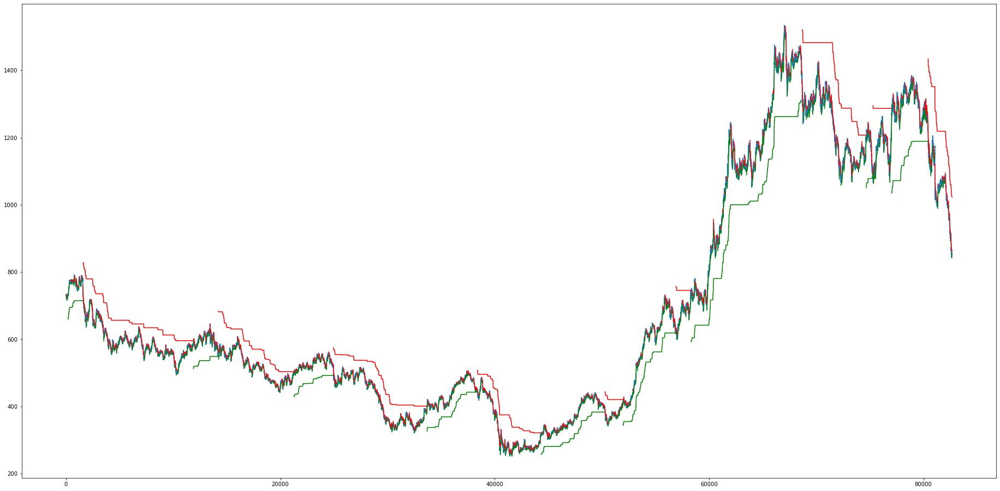

2018-01-01 09:20:00
2018-08-21 09:40:00
2019-02-22 12:50:00
2019-11-05 09:15:00
2020-06-02 10:20:00
['2018-01-01 09:20:00', '2018-08-21 09:40:00', '2019-02-22 12:50:00', '2019-11-05 09:15:00', '2020-06-02 10:20:00']
TCS


					TCS


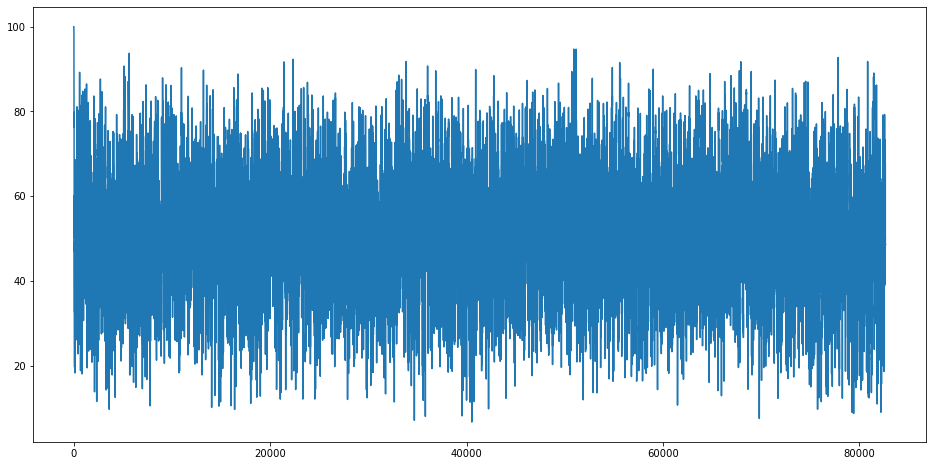

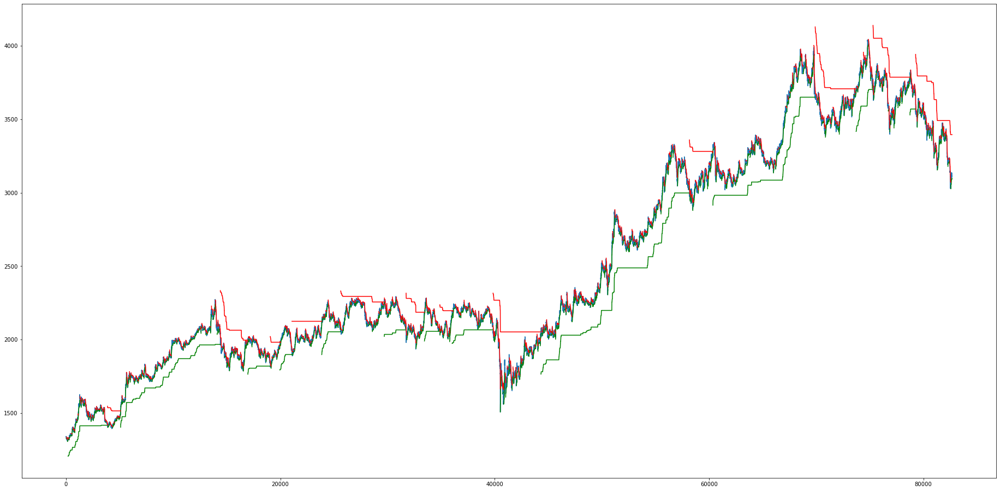

2018-01-02 09:15:00
2018-12-05 11:00:00
2019-01-30 10:50:00
2020-06-02 13:55:00
2021-04-08 13:45:00
2021-12-28 14:35:00
2022-04-05 14:25:00
['2018-01-02 09:15:00', '2018-12-05 11:00:00', '2019-01-30 10:50:00', '2020-06-02 13:55:00', '2021-04-08 13:45:00', '2021-12-28 14:35:00', '2022-04-05 14:25:00']
TECHM


					TECHM


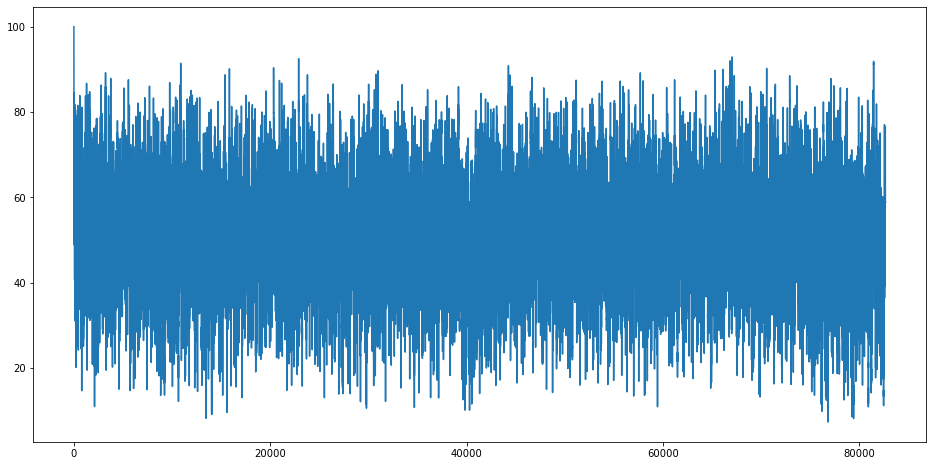

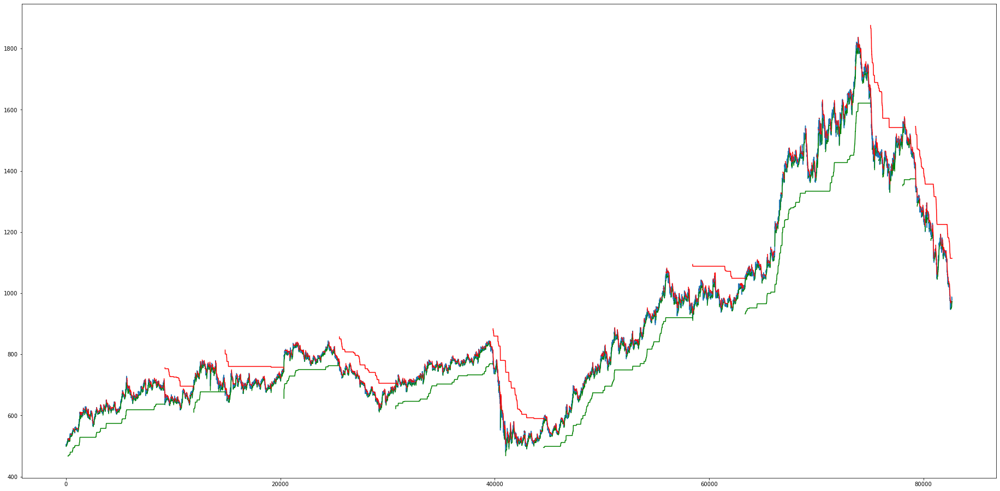

2018-01-02 14:15:00
2018-08-28 12:30:00
2019-02-07 10:55:00
2019-09-03 13:35:00
2020-06-05 12:55:00
['2018-01-02 14:15:00', '2018-08-28 12:30:00', '2019-02-07 10:55:00', '2019-09-03 13:35:00', '2020-06-05 12:55:00']
TITAN


					TITAN


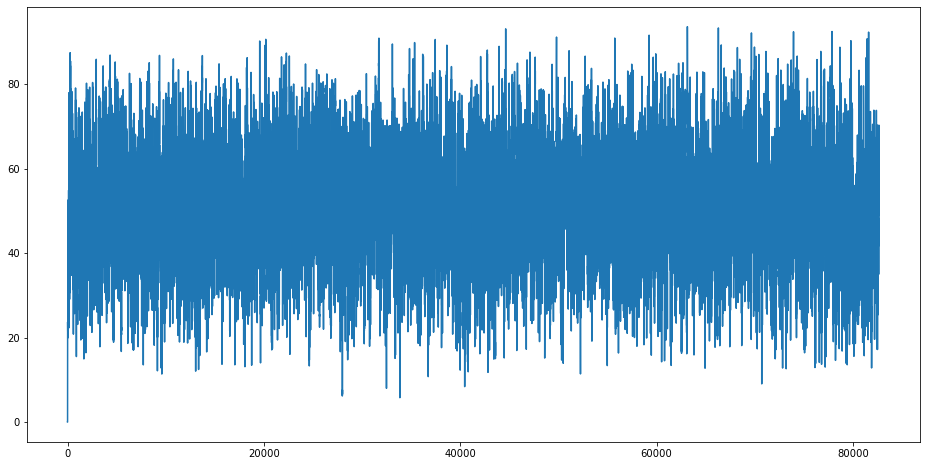

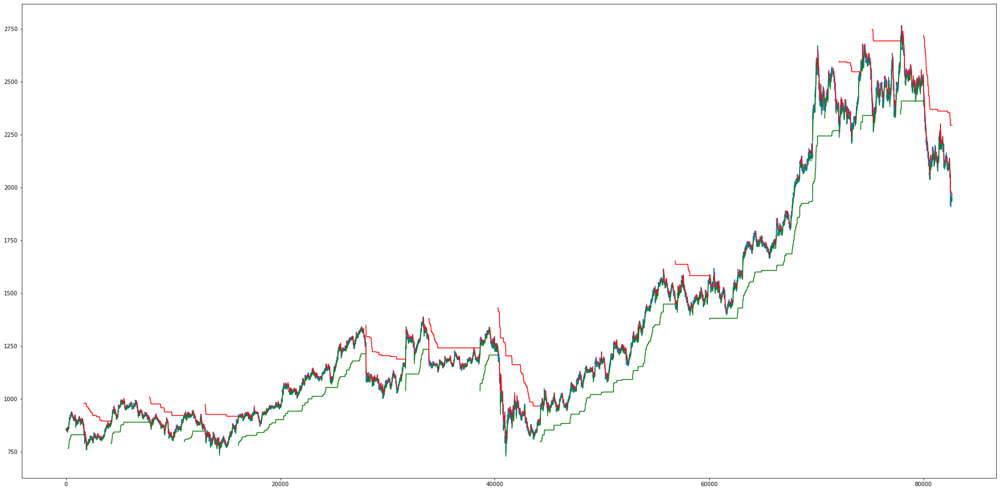

2018-01-01 09:20:00
2018-03-27 10:15:00
2018-08-02 14:40:00
2018-11-16 11:15:00
2019-09-23 14:30:00
2020-02-05 15:25:00
2020-06-02 09:20:00
2021-04-06 10:00:00
2022-01-04 13:30:00
2022-03-17 14:45:00
['2018-01-01 09:20:00', '2018-03-27 10:15:00', '2018-08-02 14:40:00', '2018-11-16 11:15:00', '2019-09-23 14:30:00', '2020-02-05 15:25:00', '2020-06-02 09:20:00', '2021-04-06 10:00:00', '2022-01-04 13:30:00', '2022-03-17 14:45:00']
UPL


					UPL


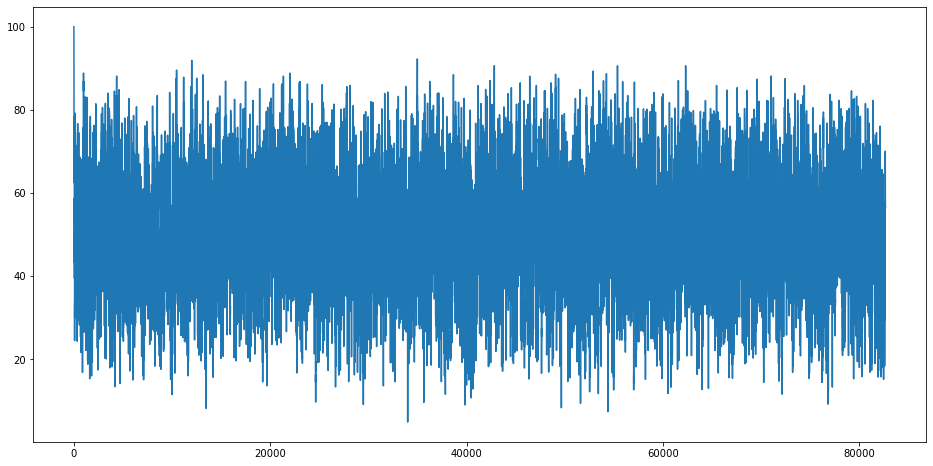

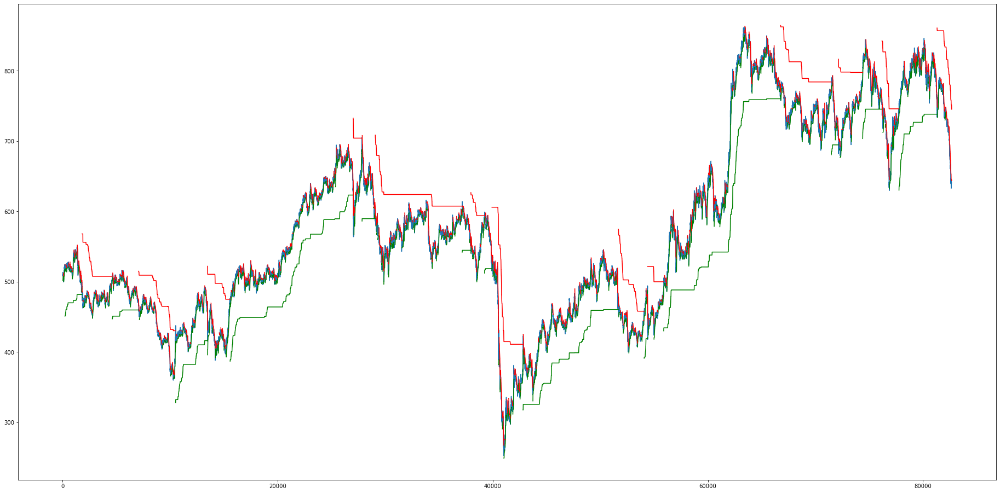

2018-01-01 14:20:00
2018-04-04 09:20:00
2018-07-24 12:55:00
2018-11-05 09:30:00
2019-07-05 10:30:00
2020-01-09 14:25:00
2020-02-17 14:15:00
2020-05-05 14:25:00
['2018-01-01 14:20:00', '2018-04-04 09:20:00', '2018-07-24 12:55:00', '2018-11-05 09:30:00', '2019-07-05 10:30:00', '2020-01-09 14:25:00', '2020-02-17 14:15:00', '2020-05-05 14:25:00']
WIPRO


					WIPRO


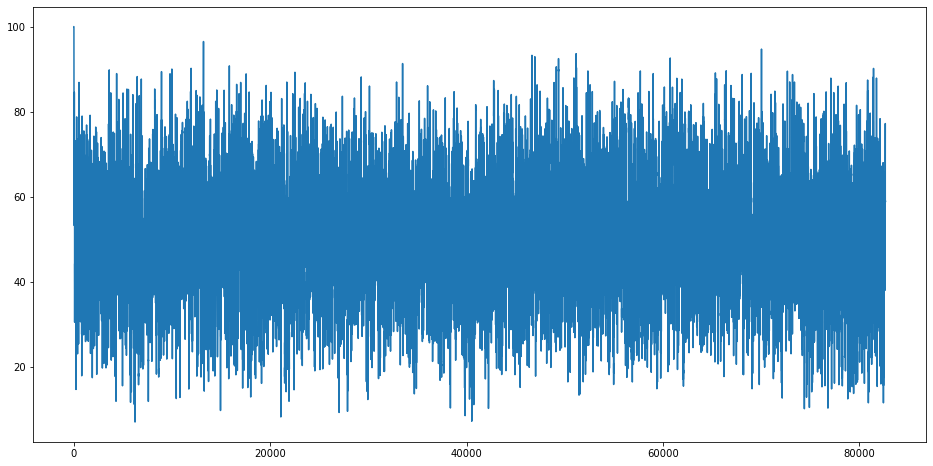

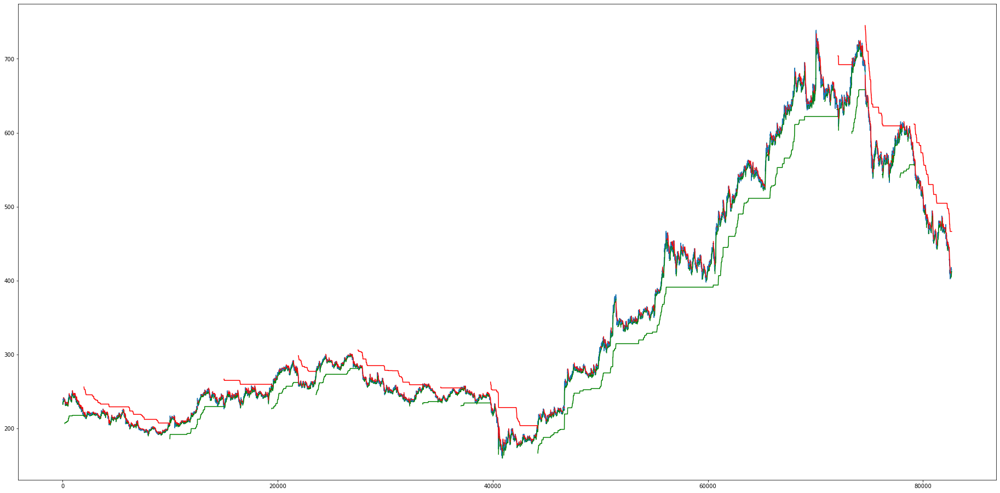

2018-01-01 15:05:00
2018-07-13 14:35:00
2019-01-22 15:15:00
2019-04-11 13:10:00
2019-10-31 14:40:00
2020-01-08 15:10:00
2020-06-01 14:00:00
2021-12-22 09:20:00
2022-03-17 14:25:00
['2018-01-01 15:05:00', '2018-07-13 14:35:00', '2019-01-22 15:15:00', '2019-04-11 13:10:00', '2019-10-31 14:40:00', '2020-01-08 15:10:00', '2020-06-01 14:00:00', '2021-12-22 09:20:00', '2022-03-17 14:25:00']
ULTRACEMCO


					ULTRACEMCO


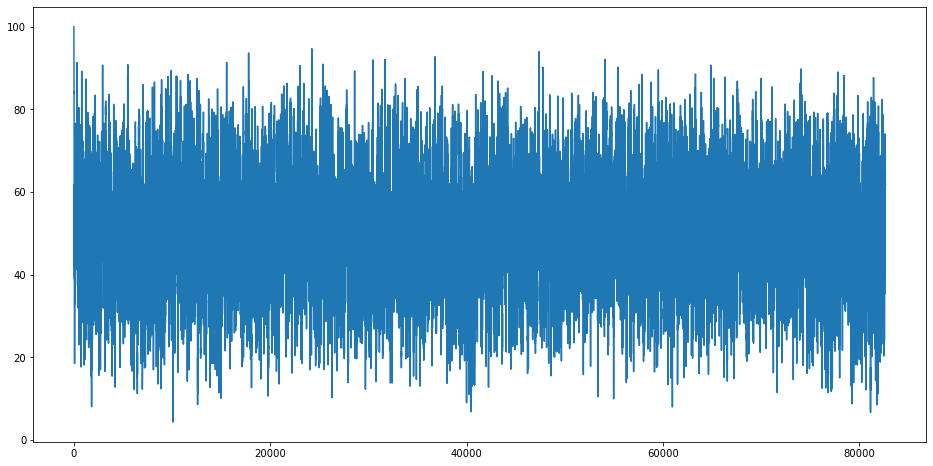

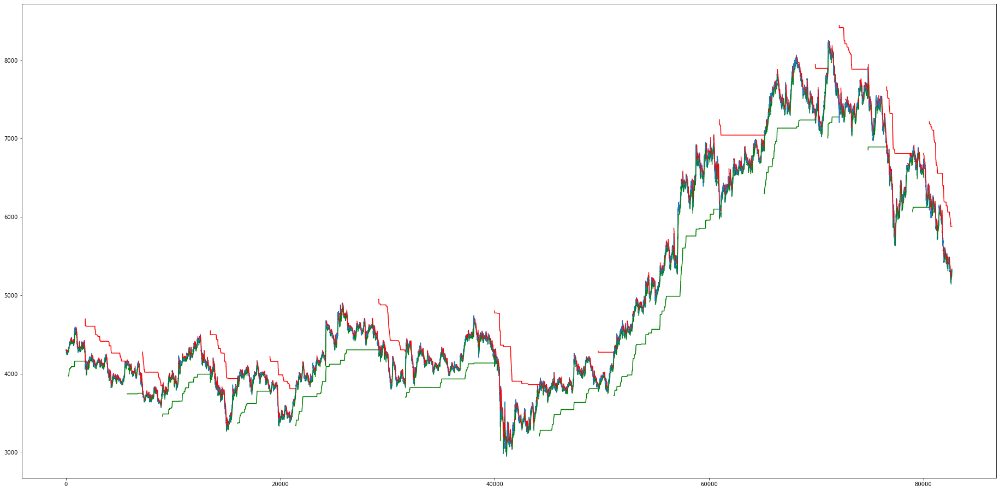

2018-01-01 14:30:00
2018-04-24 10:00:00
2018-06-26 14:55:00
2018-11-14 13:55:00
2019-03-05 13:35:00
2019-09-23 13:20:00
2020-06-01 12:00:00
2020-10-07 15:05:00
2021-07-12 13:25:00
2022-01-18 09:30:00
2022-04-11 15:05:00
['2018-01-01 14:30:00', '2018-04-24 10:00:00', '2018-06-26 14:55:00', '2018-11-14 13:55:00', '2019-03-05 13:35:00', '2019-09-23 13:20:00', '2020-06-01 12:00:00', '2020-10-07 15:05:00', '2021-07-12 13:25:00', '2022-01-18 09:30:00', '2022-04-11 15:05:00']


In [24]:
   
import xlwt
from xlwt import Workbook
wb1 = Workbook()
pnl = []
c=0
k=0
total_profit=0
profit=0
loss=0
p=0 
l=0
peak=0
drop=0
max_drawdown=0
for i in symbol:
    print(i)
    pnl.append(0)
    df = T[c]
    rsi=RSI(df)
    rsi.plot(figsize=(16, 8))
    c=c+1
    df3=df
    supertrend = Supertrend(df, 20, 5)
    df = df.join(supertrend)
    supertrend = Supertrend(df3, 200, 50)
    df3 = df3.join(supertrend)
    see(i, df, df3)
    position, time1, time2, entry, exit=backtest_supertrend(df, df3, i, rsi)
    #print(df)

    sheet = wb1.add_sheet(i)
    sheet.write(0, 0, 'Position')
    sheet.write(0, 1, 'Entry time')
    sheet.write(0, 2, 'Exit time')
    sheet.write(0, 3, 'Entry price')
    sheet.write(0, 4, 'Exit price')
    sheet.write(0, 5, 'P/L')
    for i in range(len(position)):
        sheet.write((i+1), 0, position[i])
        sheet.write((i+1), 1, time1[i])
        sheet.write((i+1), 2, time2[i])
        sheet.write((i+1), 3, entry[i])
        sheet.write((i+1), 4, exit[i])
        sheet.write((i+1), 5, (exit[i]-entry[i])*position[i])
        if((exit[i]-entry[i])*position[i]>0):
            p=p+1
            profit=profit+(exit[i]-entry[i])*position[i]
        else:
            l=l+1
            loss=loss+(exit[i]-entry[i])*position[i]
        pnl[k]=pnl[k]+(exit[i]-entry[i])*position[i]
        if(pnl[k]<peak):
            drop=peak-pnl[k]
            if(drop>max_drawdown):
                max_drawdown=drop
        if(pnl[k]>peak):
            peak=pnl[k]
            drop=0
        
    sheet.write(3, 9, 'P/L')
    sheet.write(3, 10, pnl[k])
    sheet.write(4, 9, 'Number of trades')
    sheet.write(4, 10, len(position))
    sheet.write(5, 9, 'Avg')
    sheet.write(5, 10, pnl[k]/len(position))
    sheet.write(6, 9, 'Max Drawdown')
    sheet.write(6, 10, max_drawdown)
    sheet.write(7, 9, 'Successful Trades')
    sheet.write(7, 10, p/(p+l)*100)
    sheet.write(7, 11, '%')
    sheet.write(8, 9, 'Avg Win')
    if(p>0):
        sheet.write(8, 10, profit/p)
    else:
        sheet.write(8, 10, '-')
    sheet.write(9, 9, 'Avg Loss')
    if(l>0):
        sheet.write(9, 10, loss/l)
    else:
        sheet.write(9, 10, '-')
    total_profit=total_profit+pnl[k]
    k=k+1
    peak=0
    max_drawdown=0
    drop=0
    p=0
    l=0
    profit=0
    loss =0
sheet.write(3, 12, 'Total profit')
sheet.write(3, 13, total_profit)
sheet.write(4, 12, 'ROI')
sheet.write(4, 13, total_profit/100000/5)
wb1.save('result4.xls')

In [27]:
print(total_profit)

26661.379999999997


In [ ]:
print(total_profit/100000/5)

In [18]:
print(rsi)

1        100.000000
2         96.361983
3         94.525719
4         94.902817
5         90.015165
            ...    
82672     53.963324
82673     53.963324
82674     53.963324
82675     53.963324
82676     53.963324
Name: close, Length: 82676, dtype: float64
